# Introduction

## Importing an audio file with Python

In [1]:
import wave
import pandas as pd
import numpy as np
from pydub import AudioSegment
from pydub.playback import play  # requires simpleaudio (WAV) or ffmpeg (others)

c:\Users\herie\miniconda3\envs\psc\Lib\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


In [2]:
training_labels = pd.read_csv("data/raw/training_label.csv")

folder = "data/raw/Training_data"
file = f"{folder}/1.wav"

In [3]:
training_labels 

,nombre_archivo,clase
0,1.wav,1
1,2.wav,1
2,3.wav,1
3,4.wav,1
4,5.wav,1
...,...,...
126,178.wav,5
127,179.wav,5
128,180.wav,5
129,181.wav,5


In [4]:
# plot the normalized audio file
import matplotlib.pyplot as plt
def plot_waveform(signal, title="Waveform", xlabel="Time", ylabel="Amplitude"):
    plt.figure(figsize=(15, 5))
    plt.plot(signal)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()
    

{'channels': 2, 'frame_rate': 44100, 'sample_width': 2, 'duration_ms': 225050, 'max_amplitude': 16883}


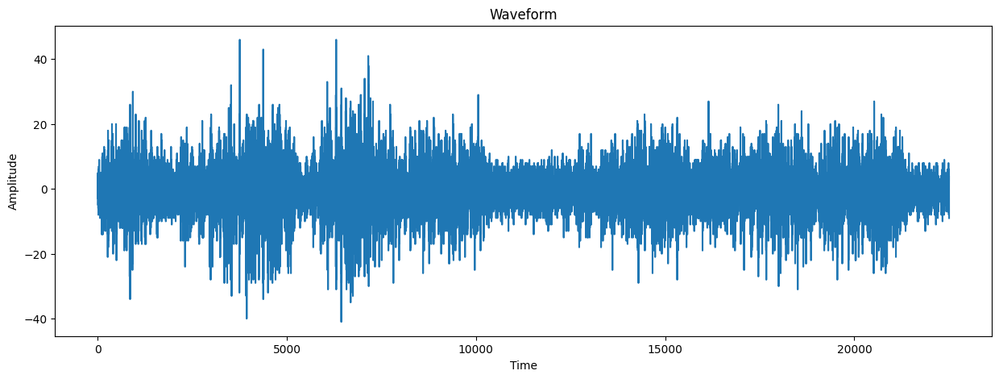

In [5]:
training_labels = pd.read_csv("data/raw/training_label.csv")

folder = "data/raw/Training_data"
file = f"{folder}/1.wav"

seg = AudioSegment.from_wav(file)  # works out of the box for WAV
# 2) Inspect core parameters
print({
    "channels": seg.channels,
    "frame_rate": seg.frame_rate,      # Hz
    "sample_width": seg.sample_width,  # bytes per sample. A byte per sample means that each sample is an integer between 0 and 255
    "duration_ms": len(seg),           # milliseconds
    "max_amplitude": seg.max           # max possible amplitude the range is 0 to (2^(8*sample_width))-1
})
# 3) Normalize to ASR-friendly PCM: mono, 16 kHz, 16-bit
target = (
    seg.set_channels(1)
       .set_frame_rate(100)
       .set_sample_width(1)  # 2 bytes = 16-bit PCM
)


plot_waveform(target.get_array_of_samples())

{'channels': 2, 'frame_rate': 44100, 'sample_width': 2, 'duration_ms': 225050, 'max_amplitude': 16883}


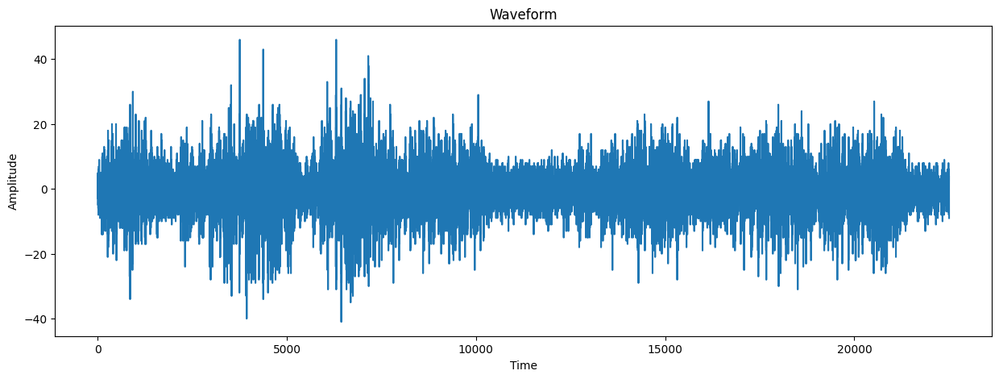

In [6]:
training_labels = pd.read_csv("data/raw/training_label.csv")

folder = "data/raw/Training_data"
file = f"{folder}/1.wav"

seg = AudioSegment.from_file(file)  # works out of the box for WAV
# 2) Inspect core parameters
print({
    "channels": seg.channels,
    "frame_rate": seg.frame_rate,      # Hz
    "sample_width": seg.sample_width,  # bytes per sample. A byte per sample means that each sample is an integer between 0 and 255
    "duration_ms": len(seg),           # milliseconds
    "max_amplitude": seg.max           # max possible amplitude the range is 0 to (2^(8*sample_width))-1
})
# 3) Normalize to ASR-friendly PCM: mono, 16 kHz, 16-bit
target = (
    seg.set_channels(1)
       .set_frame_rate(100)
       .set_sample_width(1)  # 2 bytes = 16-bit PCM
)


plot_waveform(target.get_array_of_samples())

# Plot all the audio files in a directory

C:\Users\herie\AppData\Local\Temp\ipykernel_33712\2796985231.py:116: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


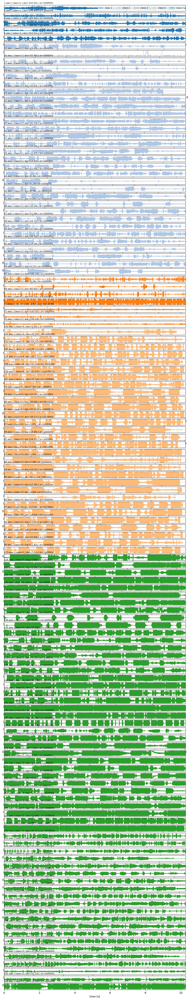

In [7]:
# %pip install -U pandas matplotlib pydub

import os, glob, math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from pydub import AudioSegment

# -----------------------------
# CONFIG
# -----------------------------
CSV_PATH   = "data/raw/training_label.csv"
AUDIO_DIR  = Path("data/raw/Training_data")
PATTERN    = "*.wav"
MAX_FILES  = None              # e.g. 120 to limit; None = all
TARGET_SR  = 16_000            # None = keep original; else resample with pydub
TARGET_SW  = 2                 # bytes per sample; 2 = 16-bit PCM
MAKE_MONO  = True              # force mono for consistent plots
DOWNSAMPLE = 4                 # plot every k-th point; set 1 for full resolution
SAVE_PNG   = None              # e.g. "results/all_waveforms_pydub.png"

# -----------------------------
# HELPERS
# -----------------------------
def segment_to_mono_np(seg: AudioSegment) -> tuple[np.ndarray, float]:
    """
    Convert a pydub AudioSegment to a normalized mono numpy array in [-1, 1),
    and return (y, sr). Handles sample width and sign.
    """
    sw = seg.sample_width
    sr = float(seg.frame_rate)
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR)
        sr = float(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
        sw = TARGET_SW

    arr = np.array(seg.get_array_of_samples())

    # Normalize by signed peak based on sample width
    # 8-bit: 128; 16-bit: 32768; 24-bit: 8388608; 32-bit: 2147483648
    peak = float(1 << (8 * sw - 1))
    y = arr.astype(np.float32) / peak
    return y, sr

# -----------------------------
# LOAD LABELS AND MATCH FILES
# -----------------------------
labels = pd.read_csv(CSV_PATH)
labels["nombre_archivo"] = labels["nombre_archivo"].astype(str)

files = sorted(glob.glob(str(AUDIO_DIR / PATTERN)))
df = pd.DataFrame({"path": files, "nombre_archivo": [Path(f).name for f in files]})
df = df.merge(labels[["nombre_archivo", "clase"]], on="nombre_archivo", how="inner")

if MAX_FILES is not None:
    df = df.iloc[:MAX_FILES].copy()

n = len(df)
assert n > 0, "No matching labeled WAV files found."

# -----------------------------
# CLASS ORDER + COLORS
# -----------------------------
class_order = sorted(df["clase"].unique())        # define class order
# preserve original within-class order while grouping by class
df["idx0"] = np.arange(len(df))
df["clase"] = pd.Categorical(df["clase"], categories=class_order, ordered=True)
df = df.sort_values(["clase", "idx0"], kind="stable").drop(columns="idx0")

palette = plt.get_cmap("tab20").colors           # fixed palette
color_map = {c: palette[i % len(palette)] for i, c in enumerate(class_order)}

# -----------------------------
# PLOT
# -----------------------------
row_h = 0.5
fig_h = max(3, row_h * n)
fig, axes = plt.subplots(nrows=n, ncols=1, figsize=(12, fig_h), sharex=False)
if n == 1:
    axes = [axes]

for ax, (p, fname, cls) in zip(
    axes,
    df[["path", "nombre_archivo", "clase"]].itertuples(index=False, name=None)
):
    seg = AudioSegment.from_file(p)

    y, sr = segment_to_mono_np(seg)
    if DOWNSAMPLE and DOWNSAMPLE > 1:
        y = y[::DOWNSAMPLE]
        sr_eff = sr / DOWNSAMPLE
    else:
        sr_eff = sr

    t = np.arange(len(y)) / sr_eff if len(y) else np.array([0.0])
    ax.plot(t, y, linewidth=0.6, color=color_map[cls])
    ax.set_title(
        f"{fname} | class={cls} | dur={len(seg)/1000:.2f}s | sr={int(sr)}Hz",
        fontsize=8,
        loc="left"
    )
    ax.set_yticks([])
    ax.grid(True, alpha=0.2)
    ax.set_xlim(0, t[-1] if len(t) else 0)

axes[-1].set_xlabel("time [s]")
legend_elems = [Line2D([0],[0], color=color_map[c], lw=2, label=f"class {c}") for c in class_order]
axes[0].legend(handles=legend_elems, ncols=min(len(class_order), 6), fontsize=8, loc="upper right", frameon=True)

plt.tight_layout()
if SAVE_PNG:
    Path(SAVE_PNG).parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(SAVE_PNG, dpi=200)
plt.show()


# Plot furier

C:\Users\herie\AppData\Local\Temp\ipykernel_3224\2694467071.py:145: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


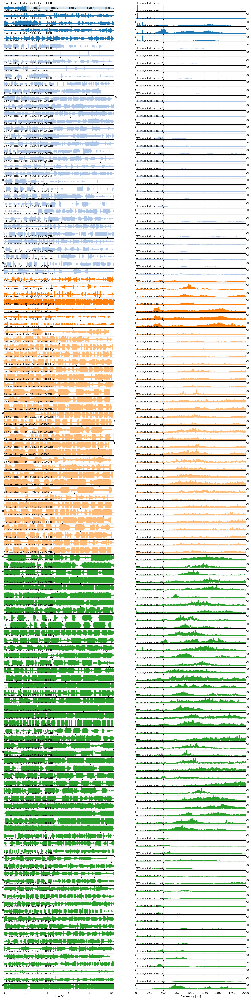

In [3]:
# %pip install -U pandas matplotlib pydub

import os, glob, math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from pydub import AudioSegment

# -----------------------------
# CONFIG
# -----------------------------
CSV_PATH   = "data/raw/training_label.csv"
AUDIO_DIR  = Path("data/raw/Training_data")
PATTERN    = "*.wav"
MAX_FILES  = None              # e.g. 120 to limit; None = all
TARGET_SR  = 16_000            # None = keep original; else resample with pydub
TARGET_SW  = 2                 # bytes per sample; 2 = 16-bit PCM
MAKE_MONO  = True              # force mono for consistent plots
DOWNSAMPLE = 4                 # plot every k-th point; set 1 for full resolution
SAVE_PNG   = None              # e.g. "results/all_waveforms_and_fft.png"

# -----------------------------
# HELPERS
# -----------------------------
def segment_to_mono_np(seg: AudioSegment) -> tuple[np.ndarray, float]:
    """
    Convert a pydub AudioSegment to a normalized mono numpy array in [-1, 1),
    and return (y, sr). Handles sample width and sign.
    """
    sw = seg.sample_width
    sr = float(seg.frame_rate)
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR)
        sr = float(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
        sw = TARGET_SW

    arr = np.array(seg.get_array_of_samples())

    # Normalize by signed peak based on sample width
    # 8-bit: 128; 16-bit: 32768; 24-bit: 8388608; 32-bit: 2147483648
    peak = float(1 << (8 * sw - 1))
    y = arr.astype(np.float32) / peak
    return y, sr

# -----------------------------
# LOAD LABELS AND MATCH FILES
# -----------------------------
labels = pd.read_csv(CSV_PATH)
labels["nombre_archivo"] = labels["nombre_archivo"].astype(str)

files = sorted(glob.glob(str(AUDIO_DIR / PATTERN)))
df = pd.DataFrame({"path": files, "nombre_archivo": [Path(f).name for f in files]})
df = df.merge(labels[["nombre_archivo", "clase"]], on="nombre_archivo", how="inner")

if MAX_FILES is not None:
    df = df.iloc[:MAX_FILES].copy()

n = len(df)
assert n > 0, "No matching labeled WAV files found."

# -----------------------------
# CLASS ORDER + COLORS
# -----------------------------
class_order = sorted(df["clase"].unique())        # define class order
df["idx0"] = np.arange(len(df))                   # preserve original within-class order
df["clase"] = pd.Categorical(df["clase"], categories=class_order, ordered=True)
df = df.sort_values(["clase", "idx0"], kind="stable").drop(columns="idx0")

palette = plt.get_cmap("tab20").colors            # fixed palette
color_map = {c: palette[i % len(palette)] for i, c in enumerate(class_order)}

# -----------------------------
# PLOT: waveform (left) + FFT magnitude (right)
# -----------------------------
row_h = 0.5
fig_h = max(3, row_h * n)
fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(16, fig_h), sharex=False)
if n == 1:
    # normalize shape to (1, 2)
    axes = np.array([axes])

for i, (p, fname, cls) in enumerate(df[["path", "nombre_archivo", "clase"]].itertuples(index=False, name=None)):
    left_ax, right_ax = axes[i]

    seg = AudioSegment.from_file(p)
    y, sr = segment_to_mono_np(seg)

    # Optional time downsampling for plotting (applies to FFT too for consistency)
    if DOWNSAMPLE and DOWNSAMPLE > 1:
        y = y[::DOWNSAMPLE]
        sr_eff = sr / DOWNSAMPLE
    else:
        sr_eff = sr

    # ---- Time-domain plot (left) ----
    if len(y):
        t = np.arange(len(y)) / sr_eff
    else:
        t = np.array([0.0])

    left_ax.plot(t, y, linewidth=0.6, color=color_map[cls])
    left_ax.set_title(f"{fname} | class={cls} | dur={len(seg)/1000:.2f}s | sr={int(sr)}Hz",
                      fontsize=8, loc="left")
    left_ax.set_yticks([])
    left_ax.grid(True, alpha=0.2)
    left_ax.set_xlim(0, t[-1] if len(t) else 0)

    # ---- Frequency-domain plot (right) ----
    if len(y) > 0:
        # Use rFFT for real signals
        Y = np.fft.rfft(y)
        freqs = np.fft.rfftfreq(len(y), d=1.0 / sr_eff)
        mag = np.abs(Y)

        right_ax.plot(freqs, mag, linewidth=0.6, color=color_map[cls])
        right_ax.set_xlim(0, sr_eff / 2.0)
    else:
        freqs = np.array([0.0])
        mag = np.array([0.0])
        right_ax.plot(freqs, mag, linewidth=0.6, color=color_map[cls])
        right_ax.set_xlim(0, 1.0)

    right_ax.set_title(f"FFT magnitude | class={cls}", fontsize=8, loc="left")
    right_ax.set_yticks([])
    right_ax.grid(True, alpha=0.2)

# Axis labels on bottom row only
axes[-1, 0].set_xlabel("time [s]")
axes[-1, 1].set_xlabel("frequency [Hz]")

# Legend on the top-left subplot
legend_elems = [Line2D([0],[0], color=color_map[c], lw=2, label=f"class {c}") for c in class_order]
axes[0, 0].legend(handles=legend_elems,
                  ncols=min(len(class_order), 6),
                  fontsize=8,
                  loc="upper right",
                  frameon=True)

plt.tight_layout()
if SAVE_PNG:
    Path(SAVE_PNG).parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(SAVE_PNG, dpi=200)
plt.show()


C:\Users\herie\AppData\Local\Temp\ipykernel_3224\4231544347.py:143: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


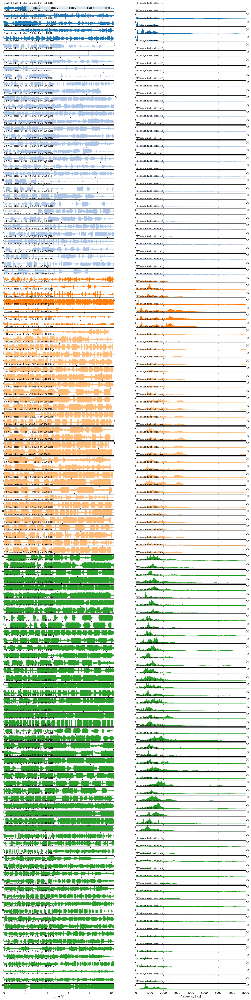

In [8]:
# %pip install -U pandas matplotlib pydub

import os, glob, math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from pydub import AudioSegment

# -----------------------------
# CONFIG
# -----------------------------
CSV_PATH   = "data/raw/training_label.csv"
AUDIO_DIR  = Path("data/raw/Training_data")
PATTERN    = "*.wav"
MAX_FILES  = None              # e.g. 120 to limit; None = all
TARGET_SR  = 16_000            # None = keep original; else resample with pydub
TARGET_SW  = 2                 # bytes per sample; 2 = 16-bit PCM
MAKE_MONO  = True              # force mono for consistent plots
DOWNSAMPLE = 4                 # only for TIME plot; FFT stays full-rate
SAVE_PNG   = None              # e.g. "results/all_waveforms_and_fft.png"

# -----------------------------
# HELPERS
# -----------------------------
def segment_to_mono_np(seg: AudioSegment) -> tuple[np.ndarray, float]:
    """
    Convert a pydub AudioSegment to a normalized mono numpy array in [-1, 1),
    and return (y, sr). Handles sample width and sign.
    """
    sw = seg.sample_width
    sr = float(seg.frame_rate)
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR)
        sr = float(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
        sw = TARGET_SW

    arr = np.array(seg.get_array_of_samples())

    # Normalize by signed peak based on sample width
    # 8-bit: 128; 16-bit: 32768; 24-bit: 8388608; 32-bit: 2147483648
    peak = float(1 << (8 * sw - 1))
    y = arr.astype(np.float32) / peak
    return y, sr

# -----------------------------
# LOAD LABELS AND MATCH FILES
# -----------------------------
labels = pd.read_csv(CSV_PATH)
labels["nombre_archivo"] = labels["nombre_archivo"].astype(str)

files = sorted(glob.glob(str(AUDIO_DIR / PATTERN)))
df = pd.DataFrame({"path": files, "nombre_archivo": [Path(f).name for f in files]})
df = df.merge(labels[["nombre_archivo", "clase"]], on="nombre_archivo", how="inner")

if MAX_FILES is not None:
    df = df.iloc[:MAX_FILES].copy()

n = len(df)
assert n > 0, "No matching labeled WAV files found."

# -----------------------------
# CLASS ORDER + COLORS
# -----------------------------
class_order = sorted(df["clase"].unique())        # define class order
df["idx0"] = np.arange(len(df))                   # preserve original within-class order
df["clase"] = pd.Categorical(df["clase"], categories=class_order, ordered=True)
df = df.sort_values(["clase", "idx0"], kind="stable").drop(columns="idx0")

palette = plt.get_cmap("tab20").colors            # fixed palette
color_map = {c: palette[i % len(palette)] for i, c in enumerate(class_order)}

# -----------------------------
# PLOT: waveform (left) + FFT magnitude (right)
# -----------------------------
row_h = 0.5
fig_h = max(3, row_h * n)
fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(16, fig_h), sharex=False)
if n == 1:
    axes = np.array([axes])  # shape -> (1, 2)

for i, (p, fname, cls) in enumerate(df[["path", "nombre_archivo", "clase"]].itertuples(index=False, name=None)):
    left_ax, right_ax = axes[i]

    seg = AudioSegment.from_file(p)
    y, sr = segment_to_mono_np(seg)
    y = np.asarray(y, dtype=np.float32)

    # --- TIME plot uses optional decimation for speed ---
    if DOWNSAMPLE and DOWNSAMPLE > 1:
        y_time = y[::DOWNSAMPLE]
        sr_time = sr / DOWNSAMPLE
    else:
        y_time, sr_time = y, sr

    # ---- Time-domain plot (left) ----
    if len(y_time):
        t = np.arange(len(y_time), dtype=np.float64) / sr_time
    else:
        t = np.array([0.0])

    left_ax.plot(t, y_time, linewidth=0.6, color=color_map[cls])
    left_ax.set_title(f"{fname} | class={cls} | dur={len(seg)/1000:.2f}s | sr={int(sr)}Hz",
                      fontsize=8, loc="left")
    left_ax.set_yticks([])
    left_ax.grid(True, alpha=0.2)
    left_ax.set_xlim(0, t[-1] if len(t) else 0)

    # ---- Frequency-domain plot (right) at FULL SAMPLE RATE ----
    if len(y) > 0:
        Y = np.fft.rfft(y)                                   # full-rate FFT
        freqs = np.fft.rfftfreq(len(y), d=1.0 / sr)
        mag = np.abs(Y)

        right_ax.plot(freqs, mag, linewidth=0.6, color=color_map[cls])
        # show up to 8 kHz if available, else up to Nyquist
        right_ax.set_xlim(0.0, min(8000.0, sr / 2.0))
    else:
        right_ax.plot([0.0], [0.0], linewidth=0.6, color=color_map[cls])
        right_ax.set_xlim(0.0, 1.0)

    right_ax.set_title(f"FFT magnitude | class={cls}", fontsize=8, loc="left")
    right_ax.set_yticks([])
    right_ax.grid(True, alpha=0.2)

# Axis labels on bottom row only
axes[-1, 0].set_xlabel("time [s]")
axes[-1, 1].set_xlabel("frequency [Hz]")

# Legend on the top-left subplot
legend_elems = [Line2D([0],[0], color=color_map[c], lw=2, label=f"class {c}") for c in class_order]
axes[0, 0].legend(handles=legend_elems,
                  ncols=min(len(class_order), 6),
                  fontsize=8,
                  loc="upper right",
                  frameon=True)

plt.tight_layout()
if SAVE_PNG:
    Path(SAVE_PNG).parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(SAVE_PNG, dpi=200)
plt.show()


C:\Users\herie\AppData\Local\Temp\ipykernel_3224\3859483634.py:143: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


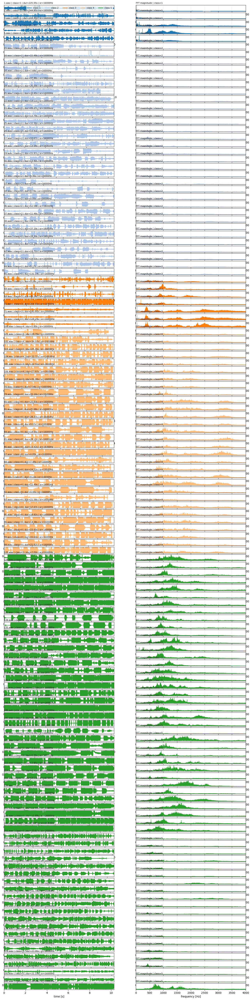

In [9]:
# %pip install -U pandas matplotlib pydub

import os, glob, math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from pydub import AudioSegment

# -----------------------------
# CONFIG
# -----------------------------
CSV_PATH   = "data/raw/training_label.csv"
AUDIO_DIR  = Path("data/raw/Training_data")
PATTERN    = "*.wav"
MAX_FILES  = None              # e.g. 120 to limit; None = all
TARGET_SR  = 16_000            # None = keep original; else resample with pydub
TARGET_SW  = 2                 # bytes per sample; 2 = 16-bit PCM
MAKE_MONO  = True              # force mono for consistent plots
DOWNSAMPLE = 4                 # only for TIME plot; FFT stays full-rate
SAVE_PNG   = None              # e.g. "results/all_waveforms_and_fft.png"

# -----------------------------
# HELPERS
# -----------------------------
def segment_to_mono_np(seg: AudioSegment) -> tuple[np.ndarray, float]:
    """
    Convert a pydub AudioSegment to a normalized mono numpy array in [-1, 1),
    and return (y, sr). Handles sample width and sign.
    """
    sw = seg.sample_width
    sr = float(seg.frame_rate)
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR)
        sr = float(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
        sw = TARGET_SW

    arr = np.array(seg.get_array_of_samples())

    # Normalize by signed peak based on sample width
    # 8-bit: 128; 16-bit: 32768; 24-bit: 8388608; 32-bit: 2147483648
    peak = float(1 << (8 * sw - 1))
    y = arr.astype(np.float32) / peak
    return y, sr

# -----------------------------
# LOAD LABELS AND MATCH FILES
# -----------------------------
labels = pd.read_csv(CSV_PATH)
labels["nombre_archivo"] = labels["nombre_archivo"].astype(str)

files = sorted(glob.glob(str(AUDIO_DIR / PATTERN)))
df = pd.DataFrame({"path": files, "nombre_archivo": [Path(f).name for f in files]})
df = df.merge(labels[["nombre_archivo", "clase"]], on="nombre_archivo", how="inner")

if MAX_FILES is not None:
    df = df.iloc[:MAX_FILES].copy()

n = len(df)
assert n > 0, "No matching labeled WAV files found."

# -----------------------------
# CLASS ORDER + COLORS
# -----------------------------
class_order = sorted(df["clase"].unique())        # define class order
df["idx0"] = np.arange(len(df))                   # preserve original within-class order
df["clase"] = pd.Categorical(df["clase"], categories=class_order, ordered=True)
df = df.sort_values(["clase", "idx0"], kind="stable").drop(columns="idx0")

palette = plt.get_cmap("tab20").colors            # fixed palette
color_map = {c: palette[i % len(palette)] for i, c in enumerate(class_order)}

# -----------------------------
# PLOT: waveform (left) + FFT magnitude (right)
# -----------------------------
row_h = 0.5
fig_h = max(3, row_h * n)
fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(16, fig_h), sharex=False)
if n == 1:
    axes = np.array([axes])  # shape -> (1, 2)

for i, (p, fname, cls) in enumerate(df[["path", "nombre_archivo", "clase"]].itertuples(index=False, name=None)):
    left_ax, right_ax = axes[i]

    seg = AudioSegment.from_file(p)
    y, sr = segment_to_mono_np(seg)
    y = np.asarray(y, dtype=np.float32)

    # --- TIME plot uses optional decimation for speed ---
    if DOWNSAMPLE and DOWNSAMPLE > 1:
        y_time = y[::DOWNSAMPLE]
        sr_time = sr / DOWNSAMPLE
    else:
        y_time, sr_time = y, sr

    # ---- Time-domain plot (left) ----
    if len(y_time):
        t = np.arange(len(y_time), dtype=np.float64) / sr_time
    else:
        t = np.array([0.0])

    left_ax.plot(t, y_time, linewidth=0.6, color=color_map[cls])
    left_ax.set_title(f"{fname} | class={cls} | dur={len(seg)/1000:.2f}s | sr={int(sr)}Hz",
                      fontsize=8, loc="left")
    left_ax.set_yticks([])
    left_ax.grid(True, alpha=0.2)
    left_ax.set_xlim(0, t[-1] if len(t) else 0)

    # ---- Frequency-domain plot (right) at FULL SAMPLE RATE ----
    if len(y) > 0:
        Y = np.fft.rfft(y)                                   # full-rate FFT
        freqs = np.fft.rfftfreq(len(y), d=1.0 / sr)
        mag = np.abs(Y)

        right_ax.plot(freqs, mag, linewidth=0.6, color=color_map[cls])
        # show up to 8 kHz if available, else up to Nyquist
        right_ax.set_xlim(0.0, min(4000.0, sr / 2.0))
    else:
        right_ax.plot([0.0], [0.0], linewidth=0.6, color=color_map[cls])
        right_ax.set_xlim(0.0, 1.0)

    right_ax.set_title(f"FFT magnitude | class={cls}", fontsize=8, loc="left")
    right_ax.set_yticks([])
    right_ax.grid(True, alpha=0.2)

# Axis labels on bottom row only
axes[-1, 0].set_xlabel("time [s]")
axes[-1, 1].set_xlabel("frequency [Hz]")

# Legend on the top-left subplot
legend_elems = [Line2D([0],[0], color=color_map[c], lw=2, label=f"class {c}") for c in class_order]
axes[0, 0].legend(handles=legend_elems,
                  ncols=min(len(class_order), 6),
                  fontsize=8,
                  loc="upper right",
                  frameon=True)

plt.tight_layout()
if SAVE_PNG:
    Path(SAVE_PNG).parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(SAVE_PNG, dpi=200)
plt.show()


C:\Users\herie\AppData\Local\Temp\ipykernel_3224\3040330232.py:156: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


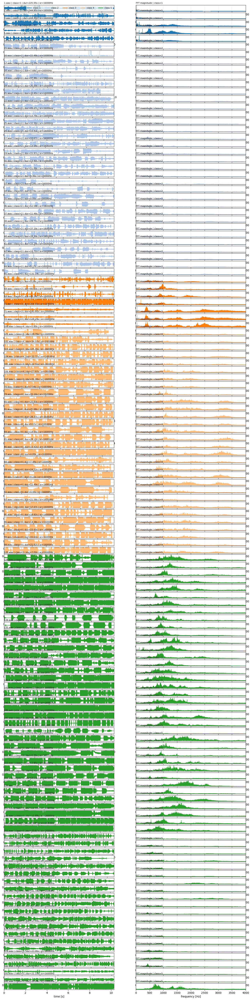

Saved long FFT: results/fft_long_0_4000.csv  rows=16,714,554


In [ ]:
# %pip install -U pandas matplotlib pydub

import os, glob, math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from pydub import AudioSegment

# -----------------------------
# CONFIG
# -----------------------------
CSV_PATH    = "data/raw/training_label.csv"
AUDIO_DIR   = Path("data/raw/Training_data")
PATTERN     = "*.wav"
MAX_FILES   = None
TARGET_SR   = 16_000
TARGET_SW   = 2
MAKE_MONO   = True
DOWNSAMPLE  = 4                 # only for TIME plot; FFT stays full-rate
SAVE_PNG    = None

# FFT export
FFT_FMAX_HZ     = 4000.0
FFT_LONG_CSV    = "results/fft_long_0_4000.csv"
FFT_WIDE_PARQUET = None        # e.g. "results/fft_wide_0_4000.parquet"

# -----------------------------
# HELPERS
# -----------------------------
def segment_to_mono_np(seg: AudioSegment) -> tuple[np.ndarray, float]:
    sw = seg.sample_width
    sr = float(seg.frame_rate)
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR)
        sr = float(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
        sw = TARGET_SW
    arr = np.array(seg.get_array_of_samples())
    peak = float(1 << (8 * sw - 1))
    y = arr.astype(np.float32) / peak
    return y, sr

# -----------------------------
# LOAD LABELS AND MATCH FILES
# -----------------------------
labels = pd.read_csv(CSV_PATH)
labels["nombre_archivo"] = labels["nombre_archivo"].astype(str)

files = sorted(glob.glob(str(AUDIO_DIR / PATTERN)))
df = pd.DataFrame({"path": files, "nombre_archivo": [Path(f).name for f in files]})
df = df.merge(labels[["nombre_archivo", "clase"]], on="nombre_archivo", how="inner")

if MAX_FILES is not None:
    df = df.iloc[:MAX_FILES].copy()

n = len(df)
assert n > 0, "No matching labeled WAV files found."

# -----------------------------
# CLASS ORDER + COLORS
# -----------------------------
class_order = sorted(df["clase"].unique())
df["idx0"] = np.arange(len(df))
df["clase"] = pd.Categorical(df["clase"], categories=class_order, ordered=True)
df = df.sort_values(["clase", "idx0"], kind="stable").drop(columns="idx0")

palette = plt.get_cmap("tab20").colors
color_map = {c: palette[i % len(palette)] for i, c in enumerate(class_order)}

# -----------------------------
# PLOT + COLLECT FFT (0–4000 Hz)
# -----------------------------
row_h = 0.5
fig_h = max(3, row_h * n)
fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(16, fig_h), sharex=False)
if n == 1:
    axes = np.array([axes])  # shape -> (1, 2)

fft_rows = []  # collect long-format rows

for i, (p, fname, cls) in enumerate(df[["path", "nombre_archivo", "clase"]].itertuples(index=False, name=None)):
    left_ax, right_ax = axes[i]

    seg = AudioSegment.from_file(p)
    y, sr = segment_to_mono_np(seg)
    y = np.asarray(y, dtype=np.float32)

    # --- TIME plot uses optional decimation for speed ---
    if DOWNSAMPLE and DOWNSAMPLE > 1:
        y_time = y[::DOWNSAMPLE]
        sr_time = sr / DOWNSAMPLE
    else:
        y_time, sr_time = y, sr

    # ---- Time-domain plot (left) ----
    if len(y_time):
        t = np.arange(len(y_time), dtype=np.float64) / sr_time
    else:
        t = np.array([0.0])

    left_ax.plot(t, y_time, linewidth=0.6, color=color_map[cls])
    left_ax.set_title(f"{fname} | class={cls} | dur={len(seg)/1000:.2f}s | sr={int(sr)}Hz",
                      fontsize=8, loc="left")
    left_ax.set_yticks([])
    left_ax.grid(True, alpha=0.2)
    left_ax.set_xlim(0, t[-1] if len(t) else 0)


    # ---- Frequency-domain (right) at FULL SAMPLE RATE ----
    if len(y) > 0:
        Y = np.fft.rfft(y)                             # complex spectrum
        freqs = np.fft.rfftfreq(len(y), d=1.0 / sr)    # Hz
        mag = np.abs(Y)                                 # amplitude spectrum

        # clamp to [0, min(4000, Nyquist)]
        fmax = min(FFT_FMAX_HZ, sr / 2.0)
        mask = (freqs >= 0.0) & (freqs <= fmax)
        f_sel = freqs[mask]
        m_sel = mag[mask]

        # append to long-format rows
        if f_sel.size:
            fft_rows.append(pd.DataFrame({
                "nombre_archivo": fname,
                "clase": cls,
                "freq_hz": f_sel.astype(np.float32),
                "mag": m_sel.astype(np.float32),
            }))

        right_ax.plot(freqs, mag, linewidth=0.6, color=color_map[cls])
        right_ax.set_xlim(0.0, fmax)
    else:
        right_ax.plot([0.0], [0.0], linewidth=0.6, color=color_map[cls])
        right_ax.set_xlim(0.0, 1.0)

    right_ax.set_title(f"FFT magnitude | class={cls}", fontsize=8, loc="left")
    right_ax.set_yticks([])
    right_ax.grid(True, alpha=0.2)

# Axis labels on bottom row only
axes[-1, 0].set_xlabel("time [s]")
axes[-1, 1].set_xlabel("frequency [Hz]")

# Legend
legend_elems = [Line2D([0],[0], color=color_map[c], lw=2, label=f"class {c}") for c in class_order]
axes[0, 0].legend(handles=legend_elems,
                  ncols=min(len(class_order), 6),
                  fontsize=8,
                  loc="upper right",
                  frameon=True)

plt.tight_layout()
if SAVE_PNG:
    Path(SAVE_PNG).parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(SAVE_PNG, dpi=200)
plt.show()

# -----------------------------
# SAVE FFT DATAFRAME(S)
# -----------------------------
fft_df = pd.concat(fft_rows, ignore_index=True) if fft_rows else pd.DataFrame(
    columns=["nombre_archivo","clase","freq_hz","mag"]
)
Path(FFT_LONG_CSV).parent.mkdir(parents=True, exist_ok=True)
fft_df.to_csv(FFT_LONG_CSV, index=False)
print(f"Saved long FFT: {FFT_LONG_CSV}  rows={len(fft_df):,}")

# Optional wide pivot: one row per file, columns = freq bins (float)
# Beware of large width if many bins.
# if not fft_df.empty and FFT_WIDE_PARQUET:
#     wide = fft_df.pivot_table(index=["nombre_archivo","clase"],
#                               columns="freq_hz", values="mag", aggfunc="first").sort_index(axis=1)
#     wide.to_parquet(FFT_WIDE_PARQUET)
#     print(f"Saved wide FFT: {FFT_WIDE_PARQUET}  shape={wide.shape}")


In [15]:
fft_df = pd.concat(fft_rows, ignore_index=True) if fft_rows else pd.DataFrame(
    columns=["nombre_archivo","clase","freq_hz","mag"]
)
FFT_LONG_CSV = "results/fft_long_0_4000.parquet"
Path(FFT_LONG_CSV).parent.mkdir(parents=True, exist_ok=True)
fft_df.to_parquet(FFT_LONG_CSV, index=False)
print(f"Saved long FFT: {FFT_LONG_CSV}  rows={len(fft_df):,}")


Saved long FFT: results/fft_long_0_4000.parquet  rows=16,714,554


In [17]:
fft_df

,nombre_archivo,clase,freq_hz,mag
0,1.wav,1,0.000000,101.098053
1,1.wav,1,0.004443,23.934931
2,1.wav,1,0.008887,7.819663
3,1.wav,1,0.013330,6.795501
4,1.wav,1,0.017774,14.025899
...,...,...,...,...
16714549,182.wav,5,3999.537109,29.588720
16714550,182.wav,5,3999.634521,19.994854
16714551,182.wav,5,3999.731934,34.740459
16714552,182.wav,5,3999.829590,28.425756


## metrics

In [20]:
import numpy as np
import pandas as pd

def _kurtosis_pearson(x: np.ndarray) -> float:
    x = np.asarray(x, dtype=float)
    n = x.size
    if n == 0:
        return np.nan
    mu = x.mean()
    v = ((x - mu) ** 2).mean()
    if v <= 0:
        return np.nan
    m4 = ((x - mu) ** 4).mean()
    return m4 / (v ** 2)

def _spec_centroid(freq: np.ndarray, mag: np.ndarray) -> float:
    p = mag.astype(float)**2
    s = p.sum()
    if s <= 0:
        return np.nan
    return float((freq * p).sum() / s)

def _spec_entropy_from_power(pow_arr: np.ndarray) -> float:
    s = pow_arr.sum()
    n = pow_arr.size
    if n == 0 or s <= 0:
        return np.nan
    p = pow_arr / s
    h = -(p * np.log(p + 1e-18)).sum()
    return float(h / np.log(n))

def build_quartile_features(
    fft_df: pd.DataFrame,
    fmax: float = 4000.0,
    nbins: int = 4,
    keep_class: bool = True
) -> pd.DataFrame:
    # ---- normalize column names ----
    df = fft_df.copy()
    # tolerate "mbre_archivo" typo
    if "nombre_archivo" not in df.columns and "mbre_archivo" in df.columns:
        df = df.rename(columns={"mbre_archivo": "nombre_archivo"})
    req = {"nombre_archivo","freq_hz","mag"}
    missing = req - set(df.columns)
    if missing:
        raise ValueError(f"Missing columns: {missing}")

    # ---- units guard: if data is likely in kHz, scale to Hz ----
    fmax_obs = float(pd.to_numeric(df["freq_hz"], errors="coerce").max())
    if np.isfinite(fmax_obs) and fmax_obs <= 10.0 and fmax > 10.0:
        df["freq_hz"] = df["freq_hz"].astype(float) * 1000.0
        fmax_obs *= 1000.0

    # ---- clip to [0, fmax] ----
    df = df.loc[(df["freq_hz"] >= 0) & (df["freq_hz"] <= fmax),
                ["nombre_archivo","freq_hz","mag"] + (["clase"] if "clase" in df.columns else [])].copy()

    # quick exit if nothing remains
    if df.empty:
        cols = ["nombre_archivo"] + (["clase"] if keep_class and "clase" in fft_df.columns else [])
        return pd.DataFrame(columns=cols)

    # ---- quartile binning ----
    edges = np.linspace(0.0, fmax, nbins + 1)  # [0,1000,2000,3000,4000]
    labels = list(range(1, nbins + 1))         # 1..4
    df["q"] = pd.cut(df["freq_hz"], bins=edges, labels=labels, include_lowest=True, right=True)

    # ---- precompute power ----
    df["power"] = df["mag"].astype(float)**2
    df["f_power"] = df["freq_hz"].astype(float) * df["power"]

    # ---- per-quartile stats ----
    grp_q = df.groupby(["nombre_archivo","q"], sort=False, observed=True)
    q_aggs = pd.concat({
        "mean": grp_q["mag"].mean(),
        "std":  grp_q["mag"].std(ddof=1),
        "sum_power": grp_q["power"].sum(),
        "sum_fpow":  grp_q["f_power"].sum(),
        "count": grp_q["mag"].size()
    }, axis=1)

    q_aggs["spec_centroid"] = q_aggs["sum_fpow"] / q_aggs["sum_power"]
    q_aggs.loc[~np.isfinite(q_aggs["spec_centroid"]), "spec_centroid"] = np.nan

    q_entropy = grp_q["power"].apply(lambda p: _spec_entropy_from_power(p.to_numpy())).rename("spec_entropy")
    q_aggs = q_aggs.join(q_entropy, how="left")

    # pivot wide and NAME COLUMNS CORRECTLY (fix)
    wide = q_aggs.drop(columns=["sum_power","sum_fpow","count"]).unstack("q")
    # columns are MultiIndex (metric, q). Build "1qmean" etc without swapping the levels.
    wide.columns = [f"{int(q)}q{metric}" for metric, q in wide.columns]

    # ensure all quartiles exist
    for q in labels:
        for metric in ("mean","std","spec_centroid","spec_entropy"):
            col = f"{q}q{metric}"
            if col not in wide.columns:
                wide[col] = np.nan

    # ---- global stats ----
    grp_f = df.groupby("nombre_archivo", sort=False, observed=True)
    global_mean = grp_f["mag"].mean().rename("generalmean")
    global_std  = grp_f["mag"].std(ddof=1).rename("generalstd")
    global_kurt = grp_f["mag"].apply(lambda s: _kurtosis_pearson(s.to_numpy())).rename("generalkurtosis")

    def _global_spec(g):
        p = g["power"].to_numpy()
        s = p.sum()
        n = p.size
        if n == 0 or s <= 0:
            return pd.Series({"spec_centroid_all": np.nan, "spec_entropy_all": np.nan})
        cen = (g["freq_hz"].to_numpy() * p).sum() / s
        ent = _spec_entropy_from_power(p)
        return pd.Series({"spec_centroid_all": float(cen), "spec_entropy_all": float(ent)})

    gspec = grp_f.apply(_global_spec)

    out = pd.concat([wide, global_mean, global_std, global_kurt, gspec], axis=1).reset_index()

    if keep_class and "clase" in df.columns:
        first_class = df.groupby("nombre_archivo", sort=False)["clase"].first().rename("clase")
        out = first_class.reset_index().merge(out, on="nombre_archivo", how="right")

    q_cols = sum(([f"{q}qmean", f"{q}qstd", f"{q}qspec_centroid", f"{q}qspec_entropy"] for q in labels), [])
    global_cols = ["generalmean","generalstd","generalkurtosis","spec_centroid_all","spec_entropy_all"]
    ordered = ["nombre_archivo"] + (["clase"] if keep_class and "clase" in df.columns else []) + q_cols + global_cols
    out = out[[c for c in ordered if c in out.columns]]

    return out


In [21]:
features_df = build_quartile_features(fft_df, fmax=4000.0, nbins=4, keep_class=True)
features_df.head()

C:\Users\herie\AppData\Local\Temp\ipykernel_3224\904091771.py:116: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  gspec = grp_f.apply(_global_spec)


,nombre_archivo,clase,1qmean,1qstd,1qspec_centroid,1qspec_entropy,2qmean,2qstd,2qspec_centroid,2qspec_entropy,...,3qspec_entropy,4qmean,4qstd,4qspec_centroid,4qspec_entropy,generalmean,generalstd,generalkurtosis,spec_centroid_all,spec_entropy_all
0,1.wav,1,145.221054,141.868271,456.520815,0.836934,124.542282,120.010216,1408.427433,0.906554,...,0.885014,39.835106,31.107639,3330.313696,0.931500,86.691795,107.534676,4332.442858,996.088051,0.848985
1,2.wav,1,120.860619,168.131683,170.887802,0.766338,70.301720,44.518486,1387.494154,0.952574,...,0.942819,105.542618,56.049488,3481.147500,0.965799,107.010956,105.890572,4051.553861,1508.092750,0.864006
2,3.wav,1,170.130737,145.013474,526.906934,0.921770,216.156906,169.568207,1319.514872,0.933868,...,0.962059,64.422905,39.520344,3370.007904,0.954883,131.076569,131.819946,13.021508,1180.267867,0.909344
3,4.wav,1,135.448288,153.557312,621.188884,0.896343,120.180580,103.590073,1276.820920,0.927011,...,0.962554,21.059841,13.357598,3414.124418,0.953348,74.211433,107.496330,15.037457,902.611801,0.871781
4,5.wav,1,295.797791,238.811966,553.091894,0.915157,426.776550,396.739136,1283.197671,0.925145,...,0.940189,116.903595,64.365875,3419.618965,0.963487,233.006516,272.897827,53.892082,1188.824396,0.893012


In [ ]:
# right

In [12]:

if not fft_df.empty and FFT_WIDE_PARQUET:
    wide = fft_df.pivot_table(index=["nombre_archivo","clase"],
                              columns="freq_hz", values="mag", aggfunc="first").sort_index(axis=1)
    wide.to_parquet(FFT_WIDE_PARQUET)
    print(f"Saved wide FFT: {FFT_WIDE_PARQUET}  shape={wide.shape}")


In [ ]:
# %pip install -U numpy pandas pydub

import os, glob, math, json
from pathlib import Path
from typing import Dict, Tuple, List

import numpy as np
import pandas as pd
from pydub import AudioSegment

# ============================
# CONFIG
# ============================
CSV_PATH    = "data/raw/training_label.csv"   # set None if no labels
AUDIO_DIR   = Path("data/raw/Training_data")
PATTERN     = "*.wav"
OUT_CSV     = "results/audio_metrics.csv"
OUT_PARQUET = None  # e.g. "results/audio_metrics.parquet"

# Resample / format controls (use your previous choices)
TARGET_SR   = 16_000       # None = keep original
TARGET_SW   = 2            # bytes per sample (2 = 16-bit)
MAKE_MONO   = True

# Frame settings for short-time metrics (ZCR, flux, etc.)
FRAME_SEC   = 0.025        # 25 ms
HOP_SEC     = 0.010        # 10 ms

# Spectral rolloff mass fractions
ROLLOFFS    = (0.85, 0.95)

# Energy bands (Hz) for band energy ratios
BANDS       = [(0,250), (250,500), (500,2000), (2000,5000), (5000,8000)]

# Top-K spectral peaks to report
TOPK        = 3

# ============================
# HELPERS
# ============================
def segment_to_mono_np(seg: AudioSegment) -> Tuple[np.ndarray, float, int]:
    """pydub.AudioSegment -> mono float32 array in [-1,1) + sr + sample_width_bytes."""
    sw = seg.sample_width
    sr = float(seg.frame_rate)
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR)
        sr = float(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
        sw = TARGET_SW
    arr = np.array(seg.get_array_of_samples())
    peak = float(1 << (8 * sw - 1))
    y = arr.astype(np.float32) / peak
    return y, sr, sw

def frame_signal(y: np.ndarray, frame: int, hop: int) -> np.ndarray:
    """Return shape (n_frames, frame) with Hann window applied."""
    n = len(y)
    if n < frame:
        return np.empty((0, frame), dtype=np.float32)
    n_frames = 1 + (n - frame) // hop
    idx = np.arange(frame)[None, :] + hop * np.arange(n_frames)[:, None]
    win = np.hanning(frame).astype(np.float32)
    return (y[idx] * win).astype(np.float32)

def zero_crossing_rate(frames: np.ndarray) -> np.ndarray:
    """Per-frame ZCR in crossings/sample."""
    if frames.size == 0:
        return np.array([], dtype=np.float32)
    s = np.signbit(frames)
    return np.mean(np.abs(np.diff(s, axis=1)), axis=1).astype(np.float32)

def rms(frames: np.ndarray) -> np.ndarray:
    if frames.size == 0:
        return np.array([], dtype=np.float32)
    return np.sqrt(np.mean(frames**2, axis=1) + 1e-20).astype(np.float32)

def rfft_power(x: np.ndarray, sr: float) -> Tuple[np.ndarray, np.ndarray]:
    """Power spectrum of a real signal and its freq grid."""
    if x.size == 0:
        return np.array([0.0]), np.array([0.0])
    Y = np.fft.rfft(x)
    P = (Y.real**2 + Y.imag**2).astype(np.float64)
    f = np.fft.rfftfreq(len(x), d=1.0/sr).astype(np.float64)
    return P, f

def spectral_moments(P: np.ndarray, f: np.ndarray) -> Dict[str, float]:
    """Return centroid, spread, skew, kurt using power weights."""
    eps = 1e-20
    S = float(P.sum()) + eps
    p = P / S
    mu = float((p * f).sum())
    var = float((p * (f - mu)**2).sum())
    sd = math.sqrt(max(var, 0.0))
    m3 = float((p * (f - mu)**3).sum())
    m4 = float((p * (f - mu)**4).sum())
    skew = m3 / (sd**3 + eps)
    kurt = m4 / (sd**4 + eps)
    return {"spectral_centroid_hz": mu, "spectral_spread_hz": sd,
            "spectral_skewness": skew, "spectral_kurtosis": kurt}

def spectral_flatness(P: np.ndarray) -> float:
    eps = 1e-20
    return float(np.exp(np.mean(np.log(P + eps))) / (np.mean(P + eps)))

def spectral_entropy(P: np.ndarray) -> float:
    eps = 1e-20
    p = P / (P.sum() + eps)
    H = float(-(p * np.log2(p + eps)).sum())
    Hmax = math.log2(len(P)) if len(P) > 1 else 1.0
    return H / Hmax

def spectral_rolloff(P: np.ndarray, f: np.ndarray, q: float) -> float:
    eps = 1e-20
    c = np.cumsum(P)
    thr = q * (P.sum() + eps)
    idx = int(np.searchsorted(c, thr, side="left"))
    idx = min(max(idx, 0), len(f) - 1)
    return float(f[idx])

def band_energies(P: np.ndarray, f: np.ndarray, bands: List[Tuple[float, float]]) -> Dict[str, float]:
    total = float(P.sum() + 1e-20)
    out = {}
    for lo, hi in bands:
        mask = (f >= lo) & (f < hi)
        out[f"band_{int(lo)}_{int(hi)}_ratio"] = float(P[mask].sum()) / total
    return out

def topk_peaks(P: np.ndarray, f: np.ndarray, k: int) -> Tuple[List[float], List[float]]:
    if len(P) <= 1:
        return [0.0]*k, [0.0]*k
    # ignore DC bin
    P1, f1 = P[1:], f[1:]
    k = min(k, len(P1))
    idx = np.argpartition(P1, -k)[-k:]
    order = idx[np.argsort(P1[idx])[::-1]]
    return [float(f1[i]) for i in order], [float(P1[i]) for i in order]

def stft_flux(frames: np.ndarray, sr: float) -> np.ndarray:
    """Spectral flux across consecutive frames using L1 distance of L1-normalized magnitudes."""
    if len(frames) < 2:
        return np.array([], dtype=np.float32)
    # rFFT magnitude per frame
    mags = []
    for x in frames:
        Y = np.fft.rfft(x)
        m = np.abs(Y).astype(np.float64)
        s = m.sum() + 1e-20
        mags.append(m / s)
    mags = np.stack(mags, axis=0)
    diff = np.abs(np.diff(mags, axis=0))
    return diff.sum(axis=1).astype(np.float32)

# ============================
# PER-FILE ANALYSIS
# ============================
def analyze_vector(y: np.ndarray, sr: float) -> Dict[str, float]:
    out: Dict[str, float] = {}
    n = len(y)
    out["n_samples"]  = int(n)
    out["sr_hz"]      = float(sr)
    out["duration_s"] = float(n / sr if sr > 0 else 0.0)

    if n == 0:
        # fill zeros for all numeric fields below
        keys = [
            "mean","std","rms","rms_dbfs","peak_abs","crest_factor","zcr_mean","zcr_std",
            "spectral_centroid_hz","spectral_spread_hz","spectral_skewness","spectral_kurtosis",
            "spectral_flatness","spectral_entropy","rolloff85_hz","rolloff95_hz","dom_freq_hz",
            "spectral_flux_mean","spectral_flux_std"
        ]
        for k in keys: out[k] = 0.0
        for lo,hi in BANDS: out[f"band_{int(lo)}_{int(hi)}_ratio"] = 0.0
        for i in range(TOPK):
            out[f"top{i+1}_freq_hz"] = 0.0
            out[f"top{i+1}_power"]   = 0.0
        return out

    # ----- Time domain -----
    out["mean"]       = float(y.mean())
    out["std"]        = float(y.std(ddof=0))
    rms_all           = float(np.sqrt((y**2).mean() + 1e-20))
    out["rms"]        = rms_all
    out["rms_dbfs"]   = 20.0 * math.log10(rms_all + 1e-20)  # dB relative to full scale 1.0
    peak_abs          = float(np.max(np.abs(y)))
    out["peak_abs"]   = peak_abs
    out["crest_factor"] = float(peak_abs / (rms_all + 1e-20))

    # Short-time ZCR and spectral flux
    frame = max(1, int(round(FRAME_SEC * sr)))
    hop   = max(1, int(round(HOP_SEC * sr)))
    frames = frame_signal(y, frame, hop)
    zcr_v  = zero_crossing_rate(frames)
    out["zcr_mean"] = float(zcr_v.mean()) if zcr_v.size else 0.0
    out["zcr_std"]  = float(zcr_v.std(ddof=0)) if zcr_v.size else 0.0

    flux_v = stft_flux(frames, sr)
    out["spectral_flux_mean"] = float(flux_v.mean()) if flux_v.size else 0.0
    out["spectral_flux_std"]  = float(flux_v.std(ddof=0)) if flux_v.size else 0.0

    # ----- Whole-signal spectrum -----
    P, f = rfft_power(y, sr)
    # normalize away DC bias in dominance reporting by ignoring bin 0 in top-K
    dom_f, dom_p = topk_peaks(P, f, TOPK)
    for i,(ff,pp) in enumerate(zip(dom_f, dom_p), start=1):
        out[f"top{i}_freq_hz"] = ff
        out[f"top{i}_power"]   = pp
    if len(dom_f):
        out["dom_freq_hz"] = float(dom_f[0])
    else:
        out["dom_freq_hz"] = 0.0

    out.update(spectral_moments(P, f))
    out["spectral_flatness"] = spectral_flatness(P)
    out["spectral_entropy"]  = spectral_entropy(P)
    for q in ROLLOFFS:
        out[f"rolloff{int(q*100)}_hz"] = spectral_rolloff(P, f, q)
    out.update(band_energies(P, f, BANDS))

    # Percentile frequencies of cumulative power (25/50/75)
    c = np.cumsum(P); S = float(P.sum() + 1e-20)
    qs = [0.25, 0.50, 0.75]
    for q in qs:
        thr = q * S
        idx = int(np.searchsorted(c, thr, side="left"))
        idx = min(max(idx, 0), len(f)-1)
        out[f"freq_p{int(q*100)}_hz"] = float(f[idx])

    return out

def analyze_file(path: str) -> Dict[str, float]:
    seg = AudioSegment.from_file(path)
    y, sr, _ = segment_to_mono_np(seg)
    y = np.clip(y, -1.0, 1.0)
    out = analyze_vector(y, sr)
    out["path"] = str(path)
    out["nombre_archivo"] = Path(path).name
    return out

# ============================
# DRIVER
# ============================
def main():
    files = sorted(glob.glob(str(AUDIO_DIR / PATTERN)))
    if not files:
        raise SystemExit(f"No files at {AUDIO_DIR} matching {PATTERN}")

    rows: List[Dict[str, float]] = []
    for p in files:
        try:
            rows.append(analyze_file(p))
        except Exception as e:
            # record failure row
            rows.append({
                "path": str(p),
                "nombre_archivo": Path(p).name,
                "error": str(e)
            })

    df = pd.DataFrame(rows)

    # Optional: merge labels
    if CSV_PATH and Path(CSV_PATH).exists():
        labels = pd.read_csv(CSV_PATH)
        # Expecting columns ["nombre_archivo", "clase"]; adapt if different
        keep_cols = [c for c in labels.columns if c in {"nombre_archivo","clase"}]
        if "nombre_archivo" not in keep_cols:
            print("CSV merge skipped: 'nombre_archivo' not in CSV.")
        else:
            df = df.merge(labels[keep_cols], on="nombre_archivo", how="left")

    Path(OUT_CSV).parent.mkdir(parents=True, exist_ok=True)
    df.to_csv(OUT_CSV, index=False)
    if OUT_PARQUET:
        df.to_parquet(OUT_PARQUET, index=False)
    print(f"Saved metrics: {OUT_CSV}")
    print(f"Rows: {len(df)}, Columns: {len(df.columns)}")

# example usassge

c:\Users\herie\miniconda3\envs\psc\Lib\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


Saved metrics: results/audio_metrics.csv
Rows: 131, Columns: 39


# Plot Fourier TEST

In [26]:
# %pip install -U numpy pandas pydub

import glob
from pathlib import Path
from typing import Tuple

import numpy as np
import pandas as pd
from pydub import AudioSegment

# ============================
# CONFIG
# ============================
AUDIO_DIR   = Path("data/raw/Testing_data")   # your test folder
PATTERN     = "*.wav"
OUT_CSV     = "results/test_fft_long.csv"     # long table output
OUT_PARQUET = None                            # e.g. "results/test_fft_long.parquet"
TARGET_SR   = None                            # None = keep original rate; set e.g. 8000 or 16000 to resample
TARGET_SW   = 2                               # 2 = 16-bit PCM
MAKE_MONO   = True

# ============================
# HELPERS
# ============================
def segment_to_mono_np(seg: AudioSegment) -> Tuple[np.ndarray, float]:
    """AudioSegment -> mono float32 in [-1,1) and sample rate."""
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
    sr = float(seg.frame_rate)
    arr = np.array(seg.get_array_of_samples())
    peak = float(1 << (8*seg.sample_width - 1))
    y = arr.astype(np.float32) / peak
    return y, sr

def fft_long_table(y: np.ndarray, sr: float) -> pd.DataFrame:
    """Return DataFrame with freq_hz, mag for rFFT bins."""
    if y.size == 0:
        return pd.DataFrame({"freq_hz":[0.0], "mag":[0.0]}, dtype=np.float32)
    Y = np.fft.rfft(y)
    freqs = np.fft.rfftfreq(len(y), d=1.0/sr)
    mags = np.abs(Y).astype(np.float32)
    df = pd.DataFrame({
        "freq_hz": freqs.astype(np.float32, copy=False),
        "mag": mags
    })
    return df

# ============================
# DRIVER
# ============================
def main():
    files = sorted(glob.glob(str(AUDIO_DIR / PATTERN)))
    if not files:
        raise SystemExit(f"No files found in {AUDIO_DIR} matching {PATTERN}")

    Path(OUT_CSV).parent.mkdir(parents=True, exist_ok=True)
    wrote_header = False
    total_rows = 0

    for p in files:
        seg = AudioSegment.from_file(p)
        y, sr = segment_to_mono_np(seg)
        df_fft = fft_long_table(y, sr)
        df_fft.insert(0, "nombre_archivo", Path(p).name)

        # stream to CSV to avoid huge RAM usage
        df_fft.to_csv(OUT_CSV, index=False, mode="a", header=not wrote_header)
        wrote_header = True
        total_rows += len(df_fft)

        # optional Parquet per-file append (collect once if you prefer)
        if OUT_PARQUET:
            if not Path(OUT_PARQUET).exists():
                df_fft.to_parquet(OUT_PARQUET, index=False)
            else:
                # append by reading and concatenating (simple but memory-heavier)
                prev = pd.read_parquet(OUT_PARQUET)
                pd.concat([prev, df_fft], ignore_index=True).to_parquet(OUT_PARQUET, index=False)

    print(f"Wrote {OUT_CSV} with {total_rows} rows and 3 columns: nombre_archivo, freq_hz, mag")

if __name__ == "__main__":
    main()


Wrote results/test_fft_long.csv with 11167709 rows and 3 columns: nombre_archivo, freq_hz, mag


In [28]:
files = sorted(glob.glob(str(AUDIO_DIR / PATTERN)))
if not files:
    raise SystemExit(f"No files found in {AUDIO_DIR} matching {PATTERN}")


Path(OUT_CSV).parent.mkdir(parents=True, exist_ok=True)
wrote_header = False
total_rows = 0

for p in files:
    seg = AudioSegment.from_file(p)
    y, sr = segment_to_mono_np(seg)
    df_fft = fft_long_table(y, sr)
    df_fft.insert(0, "nombre_archivo", Path(p).name)

    # stream to CSV to avoid huge RAM usage
    # df_fft.to_csv(OUT_CSV, index=False, mode="a", header=not wrote_header)
    wrote_header = True
    total_rows += len(df_fft)

    # optional Parquet per-file append (collect once if you prefer)
    if OUT_PARQUET:
        if not Path(OUT_PARQUET).exists():
            df_fft.to_parquet(OUT_PARQUET, index=False)
        else:
            # append by reading and concatenating (simple but memory-heavier)
            prev = pd.read_parquet(OUT_PARQUET)
            pd.concat([prev, df_fft], ignore_index=True).to_parquet(OUT_PARQUET, index=False)

print(f"Wrote {OUT_CSV} with {total_rows} rows and 3 columns: nombre_archivo, freq_hz, mag")


Wrote results/test_fft_long.csv with 11167709 rows and 3 columns: nombre_archivo, freq_hz, mag


In [32]:
df_fft

,nombre_archivo,freq_hz,mag
0,9.wav,0.000000,220.765625
1,9.wav,0.284498,613.924194
2,9.wav,0.568996,807.636108
3,9.wav,0.853493,1262.423584
4,9.wav,1.137991,1402.110474
...,...,...,...
38748,9.wav,11023.719727,11.052231
38749,9.wav,11024.003906,6.373386
38750,9.wav,11024.289062,17.533203
38751,9.wav,11024.573242,4.161079


C:\Users\herie\AppData\Local\Temp\ipykernel_3224\2732800191.py:107: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


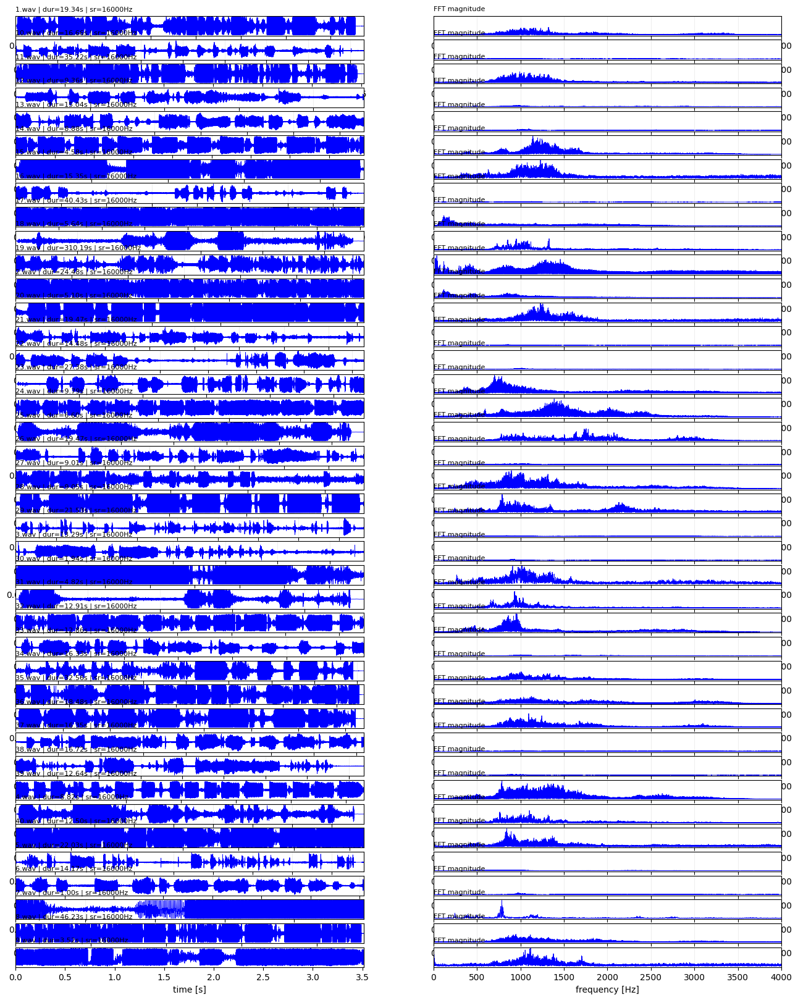

In [33]:
# %pip install -U pandas matplotlib pydub

import glob
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from pydub import AudioSegment

# -----------------------------
# CONFIG (testing set, no labels)
# -----------------------------
AUDIO_DIR  = Path("data/raw/Testing_data")
PATTERN    = "*.wav"
MAX_FILES  = None              # e.g. 120 to limit; None = all
TARGET_SR  = 16_000            # None = keep original; else resample with pydub
TARGET_SW  = 2                 # bytes per sample; 2 = 16-bit PCM
MAKE_MONO  = True              # force mono for consistent plots
DOWNSAMPLE = 2                 # plot every k-th point; set 1 for full resolution
SAVE_PNG   = None              # e.g. "results/testing_waveforms_fft.png"

# -----------------------------
# HELPERS
# -----------------------------
def segment_to_mono_np(seg: AudioSegment) -> tuple[np.ndarray, float]:
    """
    Convert a pydub AudioSegment to a normalized mono numpy array in [-1, 1),
    and return (y, sr). Handles sample width and sign.
    """
    sw = seg.sample_width
    sr = float(seg.frame_rate)
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR)
        sr = float(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
        sw = TARGET_SW

    arr = np.array(seg.get_array_of_samples())
    peak = float(1 << (8 * sw - 1))  # 8-bit:128; 16-bit:32768; 24-bit:8388608; 32-bit:2147483648
    y = arr.astype(np.float32) / peak
    return y, sr

# -----------------------------
# LIST FILES
# -----------------------------
files = sorted(glob.glob(str(AUDIO_DIR / PATTERN)))
if MAX_FILES is not None:
    files = files[:MAX_FILES]
n = len(files)
assert n > 0, f"No WAV files found in {AUDIO_DIR} with pattern {PATTERN}."

# -----------------------------
# PLOT: waveform (left) + FFT magnitude (right), all black
# -----------------------------
row_h = 0.5
fig_h = max(3, row_h * n)
fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(16, fig_h), squeeze=False, sharex=False)
fig.patch.set_facecolor("white")

for i, p in enumerate(files):
    left_ax, right_ax = axes[i]

    seg = AudioSegment.from_file(p)
    y, sr = segment_to_mono_np(seg)

    # Optional time downsampling for plotting (applies to FFT too for consistency)
    if DOWNSAMPLE and DOWNSAMPLE > 1:
        y = y[::DOWNSAMPLE]
        sr_eff = sr / DOWNSAMPLE
    else:
        sr_eff = sr

    # ---- Time-domain plot (left) ----
    if len(y):
        t = np.arange(len(y)) / sr_eff
    else:
        t = np.array([0.0])

    left_ax.plot(t, y, linewidth=0.6, color="blue")
    left_ax.set_title(f"{Path(p).name} | dur={len(seg)/1000:.2f}s | sr={int(sr)}Hz",
                      fontsize=8, loc="left")
    left_ax.set_yticks([])
    left_ax.grid(True, alpha=0.2)
    left_ax.set_xlim(0, t[-1] if len(t) else 0)

    # ---- Frequency-domain plot (right) ----
    if len(y) > 0:
        Y = np.fft.rfft(y)
        freqs = np.fft.rfftfreq(len(y), d=1.0 / sr_eff)
        mag = np.abs(Y)
        right_ax.plot(freqs, mag, linewidth=0.6, color="blue")
        right_ax.set_xlim(0, sr_eff / 2.0)
    else:
        right_ax.plot([0.0], [0.0], linewidth=0.6, color="black")
        right_ax.set_xlim(0, 1.0)

    right_ax.set_title("FFT magnitude", fontsize=8, loc="left")
    right_ax.set_yticks([])
    right_ax.grid(True, alpha=0.2)

# Axis labels on bottom row only
axes[-1, 0].set_xlabel("time [s]")
axes[-1, 1].set_xlabel("frequency [Hz]")

plt.tight_layout()
if SAVE_PNG:
    Path(SAVE_PNG).parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(SAVE_PNG, dpi=200, facecolor=fig.get_facecolor())
plt.show()


# fourier

In [36]:
# %pip install -U numpy pandas pydub

import os, glob
from pathlib import Path
from typing import Tuple
import numpy as np
import pandas as pd
from pydub import AudioSegment

# ============================
# CONFIG
# ============================
AUDIO_DIR   = Path("data/raw/Testing_data")   # flat folder of WAVs
OUT_CSV     = "results/test_fft_long.csv"
TARGET_SR   = 8000        # to get 0..4000 Hz like your sample
TARGET_SW   = 2           # 16-bit
MAKE_MONO   = True

# ============================
# HELPERS
# ============================
def segment_to_mono_np(seg: AudioSegment) -> Tuple[np.ndarray, float]:
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
    sr = float(seg.frame_rate)
    arr = np.array(seg.get_array_of_samples())
    peak = float(1 << (8*seg.sample_width - 1))
    y = arr.astype(np.float32) / peak
    return y, sr

def fft_long_table(y: np.ndarray, sr: float) -> pd.DataFrame:
    if y.size == 0:
        return pd.DataFrame({"freq_hz":[0.0], "mag":[0.0]}, dtype=np.float32)
    Y = np.fft.rfft(y)
    freqs = np.fft.rfftfreq(len(y), d=1.0/sr).astype(np.float32)
    mags  = np.abs(Y).astype(np.float32)
    return pd.DataFrame({"freq_hz": freqs, "mag": mags})

def list_wavs_flat(root: Path) -> list[str]:
    files = [str(p) for p in root.glob("*.wav")]
    # natural sort: 1.wav, 2.wav, ..., 10.wav
    def key(p):
        s = Path(p).stem
        return (int(s) if s.isdigit() else s, s)
    return sorted(files, key=key)

# ============================
# DRIVER
# ============================
def main():
    files = list_wavs_flat(AUDIO_DIR)
    if not files:
        raise SystemExit(f"No WAVs in {AUDIO_DIR.resolve()}")
    Path(OUT_CSV).parent.mkdir(parents=True, exist_ok=True)
    if Path(OUT_CSV).exists():
        Path(OUT_CSV).unlink()  # start clean

    wrote_header = False
    total_rows = 0
    print(f"Found {len(files)} files under {AUDIO_DIR.resolve()}")

    for i, p in enumerate(files, 1):
        seg = AudioSegment.from_file(p)
        y, sr = segment_to_mono_np(seg)
        df = fft_long_table(y, sr)
        df.insert(0, "nombre_archivo", Path(p).name)
        df.to_csv(OUT_CSV, index=False, mode="a", header=not wrote_header)
        wrote_header = True
        total_rows += len(df)
        print(f"[{i}/{len(files)}] {Path(p).name}: {len(df)} rows")

    print(f"Wrote {total_rows} rows to {OUT_CSV} (columns: nombre_archivo,freq_hz,mag)")

if __name__ == "__main__":
    main()


Found 40 files under C:\Users\herie\OneDrive - Fundacion Universidad de las Americas Puebla\Proyectos\En Proceso\Paralinguistic Speech Classification for Human Vocalizations\data\raw\Testing_data
[1/40] 1.wav: 77353 rows
[2/40] 2.wav: 97918 rows
[3/40] 3.wav: 53169 rows
[4/40] 4.wav: 35263 rows
[5/40] 5.wav: 88115 rows
[6/40] 6.wav: 56663 rows
[7/40] 7.wav: 4001 rows
[8/40] 8.wav: 184941 rows
[9/40] 9.wav: 14061 rows
[10/40] 10.wav: 66648 rows
[11/40] 11.wav: 140895 rows
[12/40] 12.wav: 37443 rows
[13/40] 13.wav: 60158 rows
[14/40] 14.wav: 35537 rows
[15/40] 15.wav: 18316 rows
[16/40] 16.wav: 61406 rows
[17/40] 17.wav: 161732 rows
[18/40] 18.wav: 22549 rows
[19/40] 19.wav: 1240748 rows
[20/40] 20.wav: 20402 rows
[21/40] 21.wav: 77880 rows
[22/40] 22.wav: 57911 rows
[23/40] 23.wav: 109537 rows
[24/40] 24.wav: 39165 rows
[25/40] 25.wav: 26415 rows
[26/40] 26.wav: 77880 rows
[27/40] 27.wav: 36023 rows
[28/40] 28.wav: 36207 rows
[29/40] 29.wav: 86118 rows
[30/40] 30.wav: 7777 rows
[31/40] 

In [39]:
# results/test_fft_long.csv
fft_df2 = pd.read_csv("results/test_fft_long.csv")
fft_df2

,nombre_archivo,freq_hz,mag
0,1.wav,0.000000,3205.612300
1,1.wav,0.051712,57.417656
2,1.wav,0.103423,66.724724
3,1.wav,0.155135,46.495210
4,1.wav,0.206847,56.737427
...,...,...,...
3656923,40.wav,3999.680000,122.949066
3656924,40.wav,3999.760000,33.394333
3656925,40.wav,3999.840000,69.257490
3656926,40.wav,3999.920000,65.142260


In [35]:
from pathlib import Path

def list_wavs_flat(root: Path) -> list[str]:
    files = [p for p in root.iterdir() if p.is_file() and p.suffix.lower() == ".wav"]
    files.sort(key=lambda p: (p.stem.isdigit(), int(p.stem) if p.stem.isdigit() else p.stem))
    return [str(p) for p in files]


# Get Metrics Train

In [ ]:
# %pip install -U pandas pydub

import glob
from pathlib import Path
import numpy as np
import pandas as pd
from pydub import AudioSegment

# =============================
# CONFIG
# =============================
CSV_PATH    = "data/raw/training_label.csv"
AUDIO_DIR   = Path("data/raw/Training_data")
PATTERN     = "*.wav"
MAX_FILES   = None
TARGET_SR   = 16_000
TARGET_SW   = 2
MAKE_MONO   = True
DOWNSAMPLE  = 4           # 1 = full res
WINDOW_SEC  = 0.50
HOP_SEC     = 0.25
CSV_METRICS = None        # e.g. "results/window_metrics.csv"

# =============================
# HELPERS
# =============================
def segment_to_mono_np(seg: AudioSegment):
    sw = seg.sample_width
    sr = float(seg.frame_rate)
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR); sr = float(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
    arr = np.array(seg.get_array_of_samples())
    peak = float(1 << (8 * seg.sample_width - 1))
    y = arr.astype(np.float32) / peak
    return y, sr

def frame_signal(y, sr, win_s, hop_s):
    n = len(y)
    win = max(1, int(round(win_s * sr)))
    hop = max(1, int(round(hop_s * sr)))
    if n == 0: return
    i = 0
    while True:
        j = min(i + win, n)
        yield i, j, y[i:j], win   # include nominal window length
        if j >= n: break
        i += hop

def zero_cross_rate(x):
    if len(x) < 2: return 0.0
    return np.mean(np.abs(np.diff(np.signbit(x)).astype(np.float32)))

def crest_factor(x, eps=1e-12):
    if len(x) == 0: return 0.0
    return (np.max(np.abs(x)) + eps) / (np.sqrt(np.mean(x*x) + eps))

def percentiles(x, qs=(1,10,25,50,75,90,99)):
    if len(x) == 0: return {f"amp_p{q}": np.nan for q in qs}
    vals = np.percentile(x, qs)
    return {f"amp_p{q}": v for q, v in zip(qs, vals)}

def temporal_entropy(x, bins=64, eps=1e-12):
    if len(x) == 0: return np.nan
    h, _ = np.histogram(x, bins=bins, range=(-1,1), density=False)
    p = h.astype(np.float64); s = p.sum()
    if s <= 0: return 0.0
    p = p / s
    return -np.sum(p * np.log2(p + eps))

def energy_entropy(x, K=10, eps=1e-12):
    n = len(x)
    if n == 0: return np.nan
    splits = np.array_split(x, K)
    e = np.array([np.sum(si*si) for si in splits], dtype=np.float64)
    if e.sum() == 0: return 0.0
    p = e / (e.sum() + eps)
    return -np.sum(p * np.log2(p + eps))

def spectral_features(mag, freqs, eps=1e-18):
    P = (mag ** 2).astype(np.float64)
    S = P.sum()
    if S <= 0:
        keys = [
            "spec_centroid","spec_spread","spec_skew","spec_kurt",
            "spec_rolloff85","spec_rolloff95","spec_flatness","spec_slope",
            "spec_decrease","spec_crest","spec_entropy","f_peak","peak_prominence",
            "band_0_250","band_250_500","band_500_1000","band_1000_2000","band_2000_4000","band_4000_8000"
        ]
        return {k: np.nan for k in keys}
    w = P / (S + eps)
    mu = np.sum(freqs * w)
    spread = np.sqrt(np.sum(((freqs - mu) ** 2) * w))
    skew = np.sum(((freqs - mu) ** 3) * w) / (spread**3 + eps)
    kurt = np.sum(((freqs - mu) ** 4) * w) / (spread**4 + eps)
    csum = np.cumsum(P)
    def rolloff(q):
        idx = np.searchsorted(csum, q * S, side="left")
        idx = min(idx, len(freqs)-1)
        return freqs[idx]
    r85 = rolloff(0.85); r95 = rolloff(0.95)
    flat = np.exp(np.mean(np.log(P + eps))) / (np.mean(P) + eps)
    x = freqs; y = mag
    xmean = x.mean(); ymean = y.mean()
    slope = np.sum((x - xmean) * (y - ymean)) / (np.sum((x - xmean)**2) + eps)
    k = np.arange(1, len(mag))
    decrease = np.sum((mag[1:] - mag[0]) / k) / (np.sum(np.abs(mag[1:])) + eps)
    w_nonzero = w[w > 0]
    spec_ent = -np.sum(w_nonzero * np.log2(w_nonzero))
    crest = (np.max(P) + eps) / (np.mean(P) + eps)
    i_peak = int(np.argmax(P))
    f_peak = freqs[i_peak]
    if len(P) > 2:
        i2 = np.argpartition(P, -2)[-2:]
        p_sorted = np.sort(P[i2])
        prom = p_sorted[-1] / (p_sorted[-2] + eps) if len(p_sorted) == 2 else np.nan
    else:
        prom = np.nan
    bands = [(0,250),(250,500),(500,1000),(1000,2000),(2000,4000),(4000,8000)]
    band_feats = {}
    for lo, hi in bands:
        m = (freqs >= lo) & (freqs < hi)
        band_feats[f"band_{lo}_{hi}"] = P[m].sum() / (S + eps)
    return {
        "spec_centroid": mu,
        "spec_spread": spread,
        "spec_skew": skew,
        "spec_kurt": kurt,
        "spec_rolloff85": r85,
        "spec_rolloff95": r95,
        "spec_flatness": flat,
        "spec_slope": slope,
        "spec_decrease": decrease,
        "spec_crest": crest,
        "spec_entropy": spec_ent,
        "f_peak": f_peak,
        "peak_prominence": prom,
        **band_feats
    }

def spectral_flux(curr_mag, prev_mag):
    if prev_mag is None: return np.nan
    eps = 1e-12
    a = curr_mag / (np.linalg.norm(curr_mag) + eps)
    b = prev_mag / (np.linalg.norm(prev_mag) + eps)
    return np.sqrt(np.sum((a - b)**2))

def pitch_autocorr(frame, sr, fmin=50.0, fmax=500.0):
    n = len(frame)
    if n < 3: return np.nan, np.nan
    x = frame - np.mean(frame)
    if np.allclose(x, 0.0): return np.nan, np.nan
    lag_min = int(sr / fmax)
    lag_max = min(int(sr / fmin), n-1)
    if lag_max <= lag_min: return np.nan, np.nan
    acf = np.array([np.dot(x[:-lag], x[lag:]) for lag in range(lag_min, lag_max+1)], dtype=np.float64)
    lag_hat = lag_min + int(np.argmax(acf))
    f0 = sr / lag_hat if lag_hat > 0 else np.nan
    hr = acf.max() / (np.dot(x, x) + 1e-12)
    return f0, hr

def next_pow2(n):
    n = max(1, int(n))
    return 1 << (int(np.ceil(np.log2(n))))

def window_metrics_for_signal(y, sr, win_s, hop_s, cls, fname):
    rows = []
    prev_mag = None
    win_n = max(1, int(round(win_s * sr)))
    n_fft = next_pow2(win_n)          # constant FFT size per signal
    freqs_const = np.fft.rfftfreq(n_fft, d=1.0/sr)
    for w_idx, (i, j, x, win_nom) in enumerate(frame_signal(y, sr, win_s, hop_s)):
        t0 = i / sr; t1 = j / sr
        # time features
        rms = np.sqrt(np.mean(x*x)) if len(x) else 0.0
        zcr = zero_cross_rate(x)
        cf  = crest_factor(x)
        ptp = np.ptp(x) if len(x) else 0.0
        var = float(np.var(x)) if len(x) else 0.0
        skw = (pd.Series(x).skew() if len(x) > 2 else np.nan)
        kur = (pd.Series(x).kurt() if len(x) > 3 else np.nan)
        ent_t = temporal_entropy(x)
        ent_e = energy_entropy(x)
        pct  = percentiles(x)
        # spectrum with fixed n_fft
        if len(x) > 0:
            Y = np.fft.rfft(x, n=n_fft)
            mag = np.abs(Y)
            spec = spectral_features(mag, freqs_const)
            spec["spec_flux"] = spectral_flux(mag, prev_mag)
            prev_mag = mag
        else:
            spec = {k: np.nan for k in [
                "spec_centroid","spec_spread","spec_skew","spec_kurt","spec_rolloff85","spec_rolloff95",
                "spec_flatness","spec_slope","spec_decrease","spec_crest","spec_entropy",
                "f_peak","peak_prominence","band_0_250","band_250_500","band_500_1000","band_1000_2000","band_2000_4000","band_4000_8000",
                "spec_flux"
            ]}
        f0, hr = pitch_autocorr(x, sr)
        row = {
            "nombre_archivo": fname,
            "clase": cls,
            "win_idx": w_idx,
            "t_start": t0,
            "t_end": t1,
            "duration": t1 - t0,
            "rms": rms,
            "var": var,
            "zcr": zcr,
            "crest_factor": cf,
            "peak_to_peak": ptp,
            "skew_time": skw,
            "kurt_time": kur,
            "entropy_time": ent_t,
            "entropy_energy": ent_e,
            "f0_autocorr": f0,
            "harmonic_ratio": hr,
            **spec,
            **pct
        }
        rows.append(row)
    return rows

# =============================
# LOAD
# =============================
labels = pd.read_csv(CSV_PATH)
labels["nombre_archivo"] = labels["nombre_archivo"].astype(str)

files = sorted(glob.glob(str(AUDIO_DIR / PATTERN)))
df = pd.DataFrame({"path": files, "nombre_archivo": [Path(f).name for f in files]})
df = df.merge(labels[["nombre_archivo", "clase"]], on="nombre_archivo", how="inner")
if MAX_FILES is not None:
    df = df.iloc[:MAX_FILES].copy()
assert len(df) > 0, "No matching labeled WAV files found."

# class order
class_order = sorted(df["clase"].unique())
df["idx0"] = np.arange(len(df))
df["clase"] = pd.Categorical(df["clase"], categories=class_order, ordered=True)
df = df.sort_values(["clase", "idx0"], kind="stable").drop(columns="idx0")

# =============================
# METRICS DATAFRAME
# =============================
all_rows = []
for p, fname, cls in df[["path","nombre_archivo","clase"]].itertuples(index=False, name=None):
    seg = AudioSegment.from_file(p)
    y, sr = segment_to_mono_np(seg)
    if DOWNSAMPLE and DOWNSAMPLE > 1:
        y = y[::DOWNSAMPLE]
        sr_eff = sr / DOWNSAMPLE
    else:
        sr_eff = sr
    all_rows.extend(window_metrics_for_signal(y, sr_eff, WINDOW_SEC, HOP_SEC, cls, fname))

metrics_df = pd.DataFrame(all_rows).sort_values(["nombre_archivo","win_idx"]).reset_index(drop=True)
print("metrics_df shape:", metrics_df.shape)
print(metrics_df.head(3))

if CSV_METRICS:
    Path(CSV_METRICS).parent.mkdir(parents=True, exist_ok=True)
    metrics_df.to_csv(CSV_METRICS, index=False)


metrics_df shape: (16652, 44)
  nombre_archivo  clase  win_idx  t_start  t_end  duration       rms  \
0          1.wav      1        0     0.00   0.50       0.5  0.027633   
1          1.wav      1        1     0.25   0.75       0.5  0.026916   
2          1.wav      1        2     0.50   1.00       0.5  0.024307   

        var       zcr  crest_factor  ...  band_2000_4000  band_4000_8000  \
0  0.000764  0.221111      3.232535  ...        0.000105             0.0   
1  0.000724  0.221111      3.189361  ...        0.000002             0.0   
2  0.000591  0.227114      3.142575  ...        0.000036             0.0   

   spec_flux    amp_p1   amp_p10   amp_p25   amp_p50   amp_p75   amp_p90  \
0        NaN -0.064548 -0.036209 -0.019012 -0.000031  0.018013  0.035873   
1   0.555631 -0.063878 -0.035431 -0.018494 -0.000061  0.018410  0.034952   
2   0.507396 -0.058997 -0.032352 -0.016327  0.000763  0.017014  0.031821   

    amp_p99  
0  0.067505  
1  0.063322  
2  0.052248  

[3 rows x 44 c

In [ ]:
CSV_METRICS = 'data/processed/window_metrics_train.csv'

In [14]:
if CSV_METRICS:
    Path(CSV_METRICS).parent.mkdir(parents=True, exist_ok=True)
    metrics_df.to_csv(CSV_METRICS, index=False)


# Get Metrics TEST

In [11]:
# %pip install -U pandas pydub

import glob
from pathlib import Path
import numpy as np
import pandas as pd
from pydub import AudioSegment

# =============================
# CONFIG
# =============================
AUDIO_DIR   = Path("data/raw/Testing_data")
PATTERN     = "*.wav"
MAX_FILES   = None
TARGET_SR   = 16_000
TARGET_SW   = 2
MAKE_MONO   = True
DOWNSAMPLE  = 4            # 1 = full res
WINDOW_SEC  = 0.50
HOP_SEC     = 0.25
CSV_METRICS = "results/test_window_metrics.csv"   # output path

# =============================
# HELPERS
# =============================
def segment_to_mono_np(seg: AudioSegment):
    sw = seg.sample_width
    sr = float(seg.frame_rate)
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR); sr = float(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
    arr = np.array(seg.get_array_of_samples())
    peak = float(1 << (8 * seg.sample_width - 1))
    y = arr.astype(np.float32) / peak
    return y, sr

def frame_signal(y, sr, win_s, hop_s):
    n = len(y)
    win = max(1, int(round(win_s * sr)))
    hop = max(1, int(round(hop_s * sr)))
    if n == 0: return
    i = 0
    while True:
        j = min(i + win, n)
        yield i, j, y[i:j], win
        if j >= n: break
        i += hop

def zero_cross_rate(x):
    if len(x) < 2: return 0.0
    return np.mean(np.abs(np.diff(np.signbit(x)).astype(np.float32)))

def crest_factor(x, eps=1e-12):
    if len(x) == 0: return 0.0
    return (np.max(np.abs(x)) + eps) / (np.sqrt(np.mean(x*x) + eps))

def percentiles(x, qs=(1,10,25,50,75,90,99)):
    if len(x) == 0: return {f"amp_p{q}": np.nan for q in qs}
    vals = np.percentile(x, qs)
    return {f"amp_p{q}": v for q, v in zip(qs, vals)}

def temporal_entropy(x, bins=64, eps=1e-12):
    if len(x) == 0: return np.nan
    h, _ = np.histogram(x, bins=bins, range=(-1,1), density=False)
    p = h.astype(np.float64); s = p.sum()
    if s <= 0: return 0.0
    p = p / s
    return -np.sum(p * np.log2(p + eps))

def energy_entropy(x, K=10, eps=1e-12):
    n = len(x)
    if n == 0: return np.nan
    splits = np.array_split(x, K)
    e = np.array([np.sum(si*si) for si in splits], dtype=np.float64)
    if e.sum() == 0: return 0.0
    p = e / (e.sum() + eps)
    return -np.sum(p * np.log2(p + eps))

def spectral_features(mag, freqs, eps=1e-18):
    P = (mag ** 2).astype(np.float64)
    S = P.sum()
    if S <= 0:
        keys = [
            "spec_centroid","spec_spread","spec_skew","spec_kurt",
            "spec_rolloff85","spec_rolloff95","spec_flatness","spec_slope",
            "spec_decrease","spec_crest","spec_entropy","f_peak","peak_prominence",
            "band_0_250","band_250_500","band_500_1000","band_1000_2000","band_2000_4000","band_4000_8000"
        ]
        return {k: np.nan for k in keys}
    w = P / (S + eps)
    mu = np.sum(freqs * w)
    spread = np.sqrt(np.sum(((freqs - mu) ** 2) * w))
    skew = np.sum(((freqs - mu) ** 3) * w) / (spread**3 + eps)
    kurt = np.sum(((freqs - mu) ** 4) * w) / (spread**4 + eps)
    csum = np.cumsum(P)
    def rolloff(q):
        idx = np.searchsorted(csum, q * S, side="left")
        idx = min(idx, len(freqs)-1)
        return freqs[idx]
    r85 = rolloff(0.85); r95 = rolloff(0.95)
    flat = np.exp(np.mean(np.log(P + eps))) / (np.mean(P) + eps)
    x = freqs; y = mag
    xmean = x.mean(); ymean = y.mean()
    slope = np.sum((x - xmean) * (y - ymean)) / (np.sum((x - xmean)**2) + eps)
    k = np.arange(1, len(mag))
    decrease = np.sum((mag[1:] - mag[0]) / k) / (np.sum(np.abs(mag[1:])) + eps)
    w_nonzero = w[w > 0]
    spec_ent = -np.sum(w_nonzero * np.log2(w_nonzero))
    crest = (np.max(P) + eps) / (np.mean(P) + eps)
    i_peak = int(np.argmax(P))
    f_peak = freqs[i_peak]
    if len(P) > 2:
        i2 = np.argpartition(P, -2)[-2:]
        p_sorted = np.sort(P[i2])
        prom = p_sorted[-1] / (p_sorted[-2] + eps) if len(p_sorted) == 2 else np.nan
    else:
        prom = np.nan
    bands = [(0,250),(250,500),(500,1000),(1000,2000),(2000,4000),(4000,8000)]
    band_feats = {}
    for lo, hi in bands:
        m = (freqs >= lo) & (freqs < hi)
        band_feats[f"band_{lo}_{hi}"] = P[m].sum() / (S + eps)
    return {
        "spec_centroid": mu,
        "spec_spread": spread,
        "spec_skew": skew,
        "spec_kurt": kurt,
        "spec_rolloff85": r85,
        "spec_rolloff95": r95,
        "spec_flatness": flat,
        "spec_slope": slope,
        "spec_decrease": decrease,
        "spec_crest": crest,
        "spec_entropy": spec_ent,
        "f_peak": f_peak,
        "peak_prominence": prom,
        **band_feats
    }

def spectral_flux(curr_mag, prev_mag):
    if prev_mag is None: return np.nan
    eps = 1e-12
    a = curr_mag / (np.linalg.norm(curr_mag) + eps)
    b = prev_mag / (np.linalg.norm(prev_mag) + eps)
    return np.sqrt(np.sum((a - b)**2))

def pitch_autocorr(frame, sr, fmin=50.0, fmax=500.0):
    n = len(frame)
    if n < 3: return np.nan, np.nan
    x = frame - np.mean(frame)
    if np.allclose(x, 0.0): return np.nan, np.nan
    lag_min = int(sr / fmax)
    lag_max = min(int(sr / fmin), n-1)
    if lag_max <= lag_min: return np.nan, np.nan
    acf = np.array([np.dot(x[:-lag], x[lag:]) for lag in range(lag_min, lag_max+1)], dtype=np.float64)
    lag_hat = lag_min + int(np.argmax(acf))
    f0 = sr / lag_hat if lag_hat > 0 else np.nan
    hr = acf.max() / (np.dot(x, x) + 1e-12)
    return f0, hr

def next_pow2(n):
    n = max(1, int(n))
    return 1 << (int(np.ceil(np.log2(n))))

def window_metrics_for_signal(y, sr, win_s, hop_s, fname):
    rows = []
    prev_mag = None
    win_n = max(1, int(round(win_s * sr)))
    n_fft = next_pow2(win_n)                 # constant FFT size per file
    freqs_const = np.fft.rfftfreq(n_fft, d=1.0/sr)
    for w_idx, (i, j, x, _) in enumerate(frame_signal(y, sr, win_s, hop_s)):
        t0 = i / sr; t1 = j / sr
        # time features
        rms = np.sqrt(np.mean(x*x)) if len(x) else 0.0
        zcr = zero_cross_rate(x)
        cf  = crest_factor(x)
        ptp = np.ptp(x) if len(x) else 0.0
        var = float(np.var(x)) if len(x) else 0.0
        skw = (pd.Series(x).skew() if len(x) > 2 else np.nan)
        kur = (pd.Series(x).kurt() if len(x) > 3 else np.nan)
        ent_t = temporal_entropy(x)
        ent_e = energy_entropy(x)
        pct  = percentiles(x)
        # spectrum
        if len(x) > 0:
            Y = np.fft.rfft(x, n=n_fft)
            mag = np.abs(Y)
            spec = spectral_features(mag, freqs_const)
            spec["spec_flux"] = spectral_flux(mag, prev_mag)
            prev_mag = mag
        else:
            spec = {k: np.nan for k in [
                "spec_centroid","spec_spread","spec_skew","spec_kurt","spec_rolloff85","spec_rolloff95",
                "spec_flatness","spec_slope","spec_decrease","spec_crest","spec_entropy",
                "f_peak","peak_prominence","band_0_250","band_250_500","band_500_1000","band_1000_2000","band_2000_4000","band_4000_8000",
                "spec_flux"
            ]}
        f0, hr = pitch_autocorr(x, sr)
        rows.append({
            "nombre_archivo": fname,
            "win_idx": w_idx,
            "t_start": t0,
            "t_end": t1,
            "duration": t1 - t0,
            "rms": rms,
            "var": var,
            "zcr": zcr,
            "crest_factor": cf,
            "peak_to_peak": ptp,
            "skew_time": skw,
            "kurt_time": kur,
            "entropy_time": ent_t,
            "entropy_energy": ent_e,
            "f0_autocorr": f0,
            "harmonic_ratio": hr,
            **spec,
            **pct
        })
    return rows

# =============================
# LOAD FILES
# =============================
files = sorted(glob.glob(str(AUDIO_DIR / PATTERN)))
df_files = pd.DataFrame({"path": files, "nombre_archivo": [Path(f).name for f in files]})
if MAX_FILES is not None:
    df_files = df_files.iloc[:MAX_FILES].copy()
assert len(df_files) > 0, "No WAV files found in Testing_data."

# =============================
# METRICS DATAFRAME
# =============================
all_rows = []
for p, fname in df_files[["path","nombre_archivo"]].itertuples(index=False, name=None):
    seg = AudioSegment.from_file(p)
    y, sr = segment_to_mono_np(seg)
    sr_eff = sr / DOWNSAMPLE if (DOWNSAMPLE and DOWNSAMPLE > 1) else sr
    if DOWNSAMPLE and DOWNSAMPLE > 1:
        y = y[::DOWNSAMPLE]
    all_rows.extend(window_metrics_for_signal(y, sr_eff, WINDOW_SEC, HOP_SEC, fname))

metrics_df = pd.DataFrame(all_rows).sort_values(["nombre_archivo","win_idx"]).reset_index(drop=True)

Path(CSV_METRICS).parent.mkdir(parents=True, exist_ok=True)
metrics_df.to_csv(CSV_METRICS, index=False)
print("Saved:", CSV_METRICS, "| shape:", metrics_df.shape)


Saved: results/test_window_metrics.csv | shape: (3637, 43)


In [4]:
# %pip install -U numpy pandas matplotlib pydub

import glob
from pathlib import Path
import numpy as np
import pandas as pd
from pydub import AudioSegment
import matplotlib.pyplot as plt

# =============================
# CONFIG
# =============================
CSV_PATH    = "data/raw/training_label.csv"   # columns: nombre_archivo, clase
AUDIO_DIR   = Path("data/raw/Training_data")
PATTERN     = "*.wav"
MAX_FILES   = None

TARGET_SR   = 16_000        # resample rate
TARGET_SW   = 2             # bytes per sample (16-bit)
MAKE_MONO   = True
DOWNSAMPLE  = 4             # 1 = full res, 2 = half, etc.

WINDOW_SEC  = 0.50
HOP_SEC     = 0.25

CSV_METRICS = None          # e.g. "results/window_metrics.csv"
PLOT_DIR    = Path("results/plots"); PLOT_DIR.mkdir(parents=True, exist_ok=True)

# =============================
# HELPERS
# =============================
def segment_to_mono_np(seg: AudioSegment):
    """AudioSegment -> float32 in [-1,1], sr."""
    sr = float(seg.frame_rate)
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR); sr = float(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
    arr = np.array(seg.get_array_of_samples())
    peak = float(1 << (8 * seg.sample_width - 1))
    y = arr.astype(np.float32) / peak
    return y, sr

def frame_signal(y, sr, win_s, hop_s):
    n = len(y)
    if n == 0:
        return
    win = max(1, int(round(win_s * sr)))
    hop = max(1, int(round(hop_s * sr)))
    i = 0
    while True:
        j = min(i + win, n)
        yield i, j, y[i:j], win
        if j >= n: break
        i += hop

def zero_cross_rate(x):
    if len(x) < 2: return 0.0
    return np.mean(np.abs(np.diff(np.signbit(x)).astype(np.float32)))

def crest_factor(x, eps=1e-12):
    if len(x) == 0: return 0.0
    return (np.max(np.abs(x)) + eps) / (np.sqrt(np.mean(x*x) + eps))

def percentiles(x, qs=(1,10,25,50,75,90,99)):
    if len(x) == 0: return {f"amp_p{q}": np.nan for q in qs}
    vals = np.percentile(x, qs)
    return {f"amp_p{q}": v for q, v in zip(qs, vals)}

def temporal_entropy(x, bins=64, eps=1e-12):
    if len(x) == 0: return np.nan
    h, _ = np.histogram(x, bins=bins, range=(-1,1), density=False)
    s = h.sum()
    if s <= 0: return 0.0
    p = h.astype(np.float64) / s
    return -np.sum(p * np.log2(p + eps))

def energy_entropy(x, K=10, eps=1e-12):
    n = len(x)
    if n == 0: return np.nan
    splits = np.array_split(x, K)
    e = np.array([np.sum(si*si) for si in splits], dtype=np.float64)
    es = e.sum()
    if es == 0: return 0.0
    p = e / (es + eps)
    return -np.sum(p * np.log2(p + eps))

def spectral_features(mag, freqs, eps=1e-18):
    P = (mag ** 2).astype(np.float64)
    S = P.sum()
    if S <= 0:
        keys = [
            "spec_centroid","spec_spread","spec_skew","spec_kurt",
            "spec_rolloff85","spec_rolloff95","spec_flatness","spec_slope",
            "spec_decrease","spec_crest","spec_entropy","f_peak","peak_prominence",
            "band_0_250","band_250_500","band_500_1000","band_1000_2000","band_2000_4000","band_4000_8000"
        ]
        return {k: np.nan for k in keys}
    w = P / (S + eps)
    mu = np.sum(freqs * w)
    spread = np.sqrt(np.sum(((freqs - mu) ** 2) * w))
    skew = np.sum(((freqs - mu) ** 3) * w) / (spread**3 + eps)
    kurt = np.sum(((freqs - mu) ** 4) * w) / (spread**4 + eps)
    csum = np.cumsum(P)
    def rolloff(q):
        idx = np.searchsorted(csum, q * S, side="left")
        idx = min(idx, len(freqs)-1)
        return freqs[idx]
    r85 = rolloff(0.85); r95 = rolloff(0.95)
    flat = np.exp(np.mean(np.log(P + eps))) / (np.mean(P) + eps)
    x = freqs; y = mag
    xmean = x.mean(); ymean = y.mean()
    slope = np.sum((x - xmean) * (y - ymean)) / (np.sum((x - xmean)**2) + eps)
    k = np.arange(1, len(mag))
    decrease = np.sum((mag[1:] - mag[0]) / k) / (np.sum(np.abs(mag[1:])) + eps)
    w_nonzero = w[w > 0]
    spec_ent = -np.sum(w_nonzero * np.log2(w_nonzero))
    crest = (np.max(P) + eps) / (np.mean(P) + eps)
    i_peak = int(np.argmax(P))
    f_peak = freqs[i_peak]
    if len(P) > 2:
        i2 = np.argpartition(P, -2)[-2:]
        p_sorted = np.sort(P[i2])
        prom = p_sorted[-1] / (p_sorted[-2] + eps) if len(p_sorted) == 2 else np.nan
    else:
        prom = np.nan
    bands = [(0,250),(250,500),(500,1000),(1000,2000),(2000,4000),(4000,8000)]
    band_feats = {}
    for lo, hi in bands:
        m = (freqs >= lo) & (freqs < hi)
        band_feats[f"band_{lo}_{hi}"] = P[m].sum() / (S + eps)
    return {
        "spec_centroid": mu,
        "spec_spread": spread,
        "spec_skew": skew,
        "spec_kurt": kurt,
        "spec_rolloff85": r85,
        "spec_rolloff95": r95,
        "spec_flatness": flat,
        "spec_slope": slope,
        "spec_decrease": decrease,
        "spec_crest": crest,
        "spec_entropy": spec_ent,
        "f_peak": f_peak,
        "peak_prominence": prom,
        **band_feats
    }

def spectral_flux(curr_mag, prev_mag):
    if prev_mag is None: return np.nan
    eps = 1e-12
    a = curr_mag / (np.linalg.norm(curr_mag) + eps)
    b = prev_mag / (np.linalg.norm(prev_mag) + eps)
    return np.sqrt(np.sum((a - b)**2))

def pitch_autocorr(frame, sr, fmin=50.0, fmax=500.0):
    n = len(frame)
    if n < 3: return np.nan, np.nan
    x = frame - np.mean(frame)
    if np.allclose(x, 0.0): return np.nan, np.nan
    lag_min = int(sr / fmax)
    lag_max = min(int(sr / fmin), n-1)
    if lag_max <= lag_min: return np.nan, np.nan
    acf = np.array([np.dot(x[:-lag], x[lag:]) for lag in range(lag_min, lag_max+1)], dtype=np.float64)
    lag_hat = lag_min + int(np.argmax(acf))
    f0 = sr / lag_hat if lag_hat > 0 else np.nan
    hr = acf.max() / (np.dot(x, x) + 1e-12)
    return f0, hr

def next_pow2(n):
    n = max(1, int(n))
    return 1 << (int(np.ceil(np.log2(n))))

def safe_load_wav(p: Path):
    """Return (y, sr) or None on failure."""
    try:
        seg = AudioSegment.from_file(p)
        y, sr = segment_to_mono_np(seg)
        if DOWNSAMPLE and DOWNSAMPLE > 1:
            y = y[::DOWNSAMPLE]; sr = sr / DOWNSAMPLE
        return y, float(sr)
    except Exception as e:
        print(f"[read-fail] {p.name}: {e}")
        return None

def plot_wave_and_spectrum(y: np.ndarray, sr: float, title: str, out_stem: Path):
    if y is None or len(y) == 0:
        print(f"[empty] {title}")
        return
    # waveform
    t = np.arange(len(y))/sr
    plt.figure(figsize=(10,3))
    plt.plot(t, y)
    plt.xlabel("time [s]"); plt.ylabel("amplitude"); plt.title(title); plt.tight_layout()
    plt.savefig(out_stem.with_suffix(".wave.png")); plt.close()
    # spectrum
    n_fft = 2048 if len(y) >= 2048 else next_pow2(len(y))
    Y = np.abs(np.fft.rfft(y, n=n_fft))
    f = np.fft.rfftfreq(n_fft, d=1.0/sr)
    plt.figure(figsize=(10,3))
    plt.semilogy(f, Y + 1e-12)
    plt.xlabel("frequency [Hz]"); plt.ylabel("|Y(f)|"); plt.title(title + " • spectrum"); plt.tight_layout()
    plt.savefig(out_stem.with_suffix(".spec.png")); plt.close()

def window_metrics_for_signal(y, sr, win_s, hop_s, cls, fname):
    rows = []
    prev_mag = None
    win_n = max(1, int(round(win_s * sr)))
    n_fft = next_pow2(win_n)          # constant FFT size per signal
    freqs_const = np.fft.rfftfreq(n_fft, d=1.0/sr)
    for w_idx, (i, j, x, win_nom) in enumerate(frame_signal(y, sr, win_s, hop_s)):
        t0 = i / sr; t1 = j / sr
        # time features
        rms = np.sqrt(np.mean(x*x)) if len(x) else 0.0
        zcr = zero_cross_rate(x)
        cf  = crest_factor(x)
        ptp = np.ptp(x) if len(x) else 0.0
        var = float(np.var(x)) if len(x) else 0.0
        skw = (pd.Series(x).skew() if len(x) > 2 else np.nan)
        kur = (pd.Series(x).kurt() if len(x) > 3 else np.nan)
        ent_t = temporal_entropy(x)
        ent_e = energy_entropy(x)
        pct  = percentiles(x)
        # spectrum
        if len(x) > 0:
            Y = np.fft.rfft(x, n=n_fft)
            mag = np.abs(Y)
            spec = spectral_features(mag, freqs_const)
            spec["spec_flux"] = spectral_flux(mag, prev_mag)
            prev_mag = mag
        else:
            spec = {k: np.nan for k in [
                "spec_centroid","spec_spread","spec_skew","spec_kurt","spec_rolloff85","spec_rolloff95",
                "spec_flatness","spec_slope","spec_decrease","spec_crest","spec_entropy",
                "f_peak","peak_prominence","band_0_250","band_250_500","band_500_1000",
                "band_1000_2000","band_2000_4000","band_4000_8000","spec_flux"
            ]}
        f0, hr = pitch_autocorr(x, sr)
        row = {
            "nombre_archivo": fname,
            "clase": cls,
            "win_idx": w_idx,
            "t_start": t0,
            "t_end": t1,
            "duration": t1 - t0,
            "rms": rms,
            "var": var,
            "zcr": zcr,
            "crest_factor": cf,
            "peak_to_peak": ptp,
            "skew_time": skw,
            "kurt_time": kur,
            "entropy_time": ent_t,
            "entropy_energy": ent_e,
            "f0_autocorr": f0,
            "harmonic_ratio": hr,
            **spec,
            **pct
        }
        rows.append(row)
    return rows

# =============================
# LOAD (left-join labels)
# =============================
labels = pd.read_csv(CSV_PATH, dtype={"nombre_archivo": str})
labels["nombre_archivo"] = labels["nombre_archivo"].astype(str).str.strip()

files = sorted(AUDIO_DIR.glob(PATTERN))
df = pd.DataFrame({
    "path": [str(p) for p in files],
    "nombre_archivo": [p.name for p in files],
})

df = df.merge(labels[["nombre_archivo","clase"]], on="nombre_archivo", how="left")
df["clase"] = df["clase"].astype("object").fillna("UNLABELED")

if MAX_FILES is not None:
    df = df.iloc[:MAX_FILES].copy()

assert len(df) > 0, "No matching WAV files found."
print(f"Total WAV: {len(df)} | Labeled: {(df['clase']!='UNLABELED').sum()} | Unlabeled: {(df['clase']=='UNLABELED').sum()}")

# order classes with UNLABELED last
class_order = sorted(df["clase"].unique(), key=lambda c: (c=="UNLABELED", c))
df["clase"] = pd.Categorical(df["clase"], categories=class_order, ordered=True)

# =============================
# METRICS + PLOTTING
# =============================
all_rows = []
for p_str, fname, cls in df[["path","nombre_archivo","clase"]].itertuples(index=False, name=None):
    p = Path(p_str)
    lr = safe_load_wav(p)
    if lr is None:
        continue
    y, sr_eff = lr

    out_stem = PLOT_DIR / Path(fname).with_suffix("")
    plot_wave_and_spectrum(y, sr_eff, f"{fname} [{cls}]", out_stem)

    all_rows.extend(window_metrics_for_signal(y, sr_eff, WINDOW_SEC, HOP_SEC, cls, fname))

metrics_df = pd.DataFrame(all_rows).sort_values(["nombre_archivo","win_idx"]).reset_index(drop=True)
print("metrics_df shape:", metrics_df.shape)
print(metrics_df.head(3))

CSV_METRICS = 'data/processed/window_metrics_train2.csv'
if CSV_METRICS:
    Path(CSV_METRICS).parent.mkdir(parents=True, exist_ok=True)
    metrics_df.to_csv(CSV_METRICS, index=False)


C:\Users\herie\AppData\Local\Temp\ipykernel_35388\487983130.py:278: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df["clase"] = df["clase"].astype("object").fillna("UNLABELED")


Total WAV: 131 | Labeled: 131 | Unlabeled: 0
metrics_df shape: (16652, 44)
  nombre_archivo  clase  win_idx  t_start  t_end  duration       rms  \
0          1.wav      1        0     0.00   0.50       0.5  0.027633   
1          1.wav      1        1     0.25   0.75       0.5  0.026916   
2          1.wav      1        2     0.50   1.00       0.5  0.024307   

        var       zcr  crest_factor  ...  band_2000_4000  band_4000_8000  \
0  0.000764  0.221111      3.232535  ...        0.000105             0.0   
1  0.000724  0.221111      3.189361  ...        0.000002             0.0   
2  0.000591  0.227114      3.142575  ...        0.000036             0.0   

   spec_flux    amp_p1   amp_p10   amp_p25   amp_p50   amp_p75   amp_p90  \
0        NaN -0.064548 -0.036209 -0.019012 -0.000031  0.018013  0.035873   
1   0.555631 -0.063878 -0.035431 -0.018494 -0.000061  0.018410  0.034952   
2   0.507396 -0.058997 -0.032352 -0.016327  0.000763  0.017014  0.031821   

    amp_p99  
0  0.067505 

# Ultra transformed

C:\Users\herie\AppData\Local\Temp\ipykernel_28380\1773025976.py:160: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


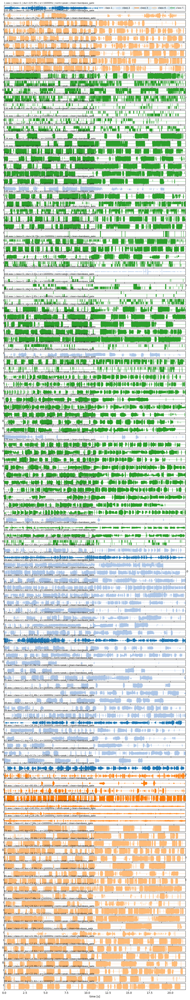

Saved 131 processed WAVs to:
C:\Users\herie\OneDrive - Fundacion Universidad de las Americas Puebla\Proyectos\En Proceso\Paralinguistic Speech Classification for Human Vocalizations\data\processed\Testing_data


In [7]:
# %pip install -U pandas matplotlib pydub

import glob
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from pydub import AudioSegment, effects as FX

# -----------------------------
# CONFIG
# -----------------------------
CSV_PATH    = "data/raw/training_label.csv"
AUDIO_DIR   = Path("data/raw/Training_data")
PATTERN     = "*.wav"
MAX_FILES   = None

# Processing
TARGET_SR   = 16_000          # None = keep original SR before export/plot
TARGET_SW   = 2               # bytes per sample in export (16-bit PCM)
MAKE_MONO   = True

# Normalization
NORMALIZE   = "peak"          # "peak", "rms", or None
TARGET_RMS  = 0.1             # used when NORMALIZE == "rms"
EPS         = 1e-12

# Noise cleaning
CLEAN_MODE  = "bandpass_gate" # "none", "bandpass", "gate", "bandpass_gate"
HPF_CUTOFF  = 100             # Hz
LPF_CUTOFF  = 6000            # Hz
GATE_K      = 1.5             # gate threshold = K * RMS

# Plotting
DOWNSAMPLE  = 4
row_h       = 0.5

# Export processed WAVs
OUTPUT_DIR  = Path(r"C:\Users\herie\OneDrive - Fundacion Universidad de las Americas Puebla\Proyectos\En Proceso\Paralinguistic Speech Classification for Human Vocalizations\data\processed\Testing_data")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# -----------------------------
# HELPERS
# -----------------------------
def clean_segment(seg: AudioSegment) -> AudioSegment:
    if CLEAN_MODE in ("bandpass", "bandpass_gate"):
        if HPF_CUTOFF is not None: seg = FX.high_pass_filter(seg, HPF_CUTOFF)
        if LPF_CUTOFF is not None: seg = FX.low_pass_filter(seg, LPF_CUTOFF)
    return seg

def seg_to_np(seg: AudioSegment) -> tuple[np.ndarray, int]:
    """Return mono float32 in [-1,1) and sample_rate."""
    if MAKE_MONO and seg.channels != 1:
        seg = seg.set_channels(1)
    if TARGET_SR is not None and seg.frame_rate != TARGET_SR:
        seg = seg.set_frame_rate(TARGET_SR)
    if TARGET_SW is not None and seg.sample_width != TARGET_SW:
        seg = seg.set_sample_width(TARGET_SW)
    sr = seg.frame_rate
    sw = seg.sample_width
    arr = np.array(seg.get_array_of_samples())
    peak = float(1 << (8 * sw - 1))
    y = arr.astype(np.float32) / peak
    return y, sr

def normalize(y: np.ndarray, mode: str | None, target_rms: float) -> np.ndarray:
    if mode is None:
        return y
    if mode == "peak":
        m = float(np.max(np.abs(y)) + EPS)
        return y / m
    if mode == "rms":
        rms = float(np.sqrt(np.mean(y**2) + EPS))
        y2 = y * (target_rms / rms)
        return np.clip(y2, -1.0, 1.0)
    raise ValueError("NORMALIZE must be 'peak', 'rms', or None")

def gate(y: np.ndarray, k: float) -> np.ndarray:
    rms = float(np.sqrt(np.mean(y**2) + EPS))
    thr = k * rms
    y2 = y.copy()
    y2[np.abs(y2) < thr] = 0.0
    return y2

def np_to_segment(y: np.ndarray, sr: int) -> AudioSegment:
    """Pack float32 [-1,1) to 16-bit PCM mono AudioSegment."""
    y16 = np.clip(y * 32767.0, -32768, 32767).astype(np.int16)
    return AudioSegment(
        y16.tobytes(), frame_rate=int(sr), sample_width=2, channels=1
    )

# -----------------------------
# LOAD LABELS AND MATCH FILES
# -----------------------------
labels = pd.read_csv(CSV_PATH)
labels["nombre_archivo"] = labels["nombre_archivo"].astype(str)

files = sorted(glob.glob(str(AUDIO_DIR / PATTERN)))
df = pd.DataFrame({"path": files, "nombre_archivo": [Path(f).name for f in files]})
df = df.merge(labels[["nombre_archivo", "clase"]], on="nombre_archivo", how="inner")
if MAX_FILES is not None:
    df = df.iloc[:MAX_FILES].copy()

n = len(df)
assert n > 0, "No matching labeled WAV files found."

# -----------------------------
# COLORS
# -----------------------------
classes = sorted(df["clase"].unique())
palette = plt.get_cmap("tab20").colors
color_map = {c: palette[i % len(palette)] for i, c in enumerate(classes)}

# -----------------------------
# PROCESS + EXPORT + PLOT
# -----------------------------
fig_h = max(3, row_h * n)
fig, axes = plt.subplots(nrows=n, ncols=1, figsize=(12, fig_h), sharex=False)
if n == 1:
    axes = [axes]

legend_elems = []

for ax, (p, fname, cls) in zip(axes, df[["path", "nombre_archivo", "clase"]].itertuples(index=False, name=None)):
    # Load and clean
    seg = AudioSegment.from_file(p)
    seg = clean_segment(seg)

    # To numpy
    y, sr = seg_to_np(seg)

    # Gate and normalize
    if CLEAN_MODE in ("gate", "bandpass_gate"):
        y = gate(y, GATE_K)
    y = normalize(y, NORMALIZE, TARGET_RMS)

    # Export processed WAV
    seg_proc = np_to_segment(y, sr)
    out_path = OUTPUT_DIR / fname
    seg_proc.export(str(out_path), format="wav")

    # Plot
    y_plot = y[::DOWNSAMPLE] if (DOWNSAMPLE and DOWNSAMPLE > 1) else y
    sr_eff = sr / (DOWNSAMPLE if (DOWNSAMPLE and DOWNSAMPLE > 1) else 1)
    t = np.arange(len(y_plot)) / sr_eff if len(y_plot) else np.array([0.0])

    ax.plot(t, y_plot, linewidth=0.6, color=color_map[cls])
    ax.set_title(
        f"{fname} | class={cls} | dur={len(seg)/1000:.2f}s | sr={sr}Hz | norm={NORMALIZE} | clean={CLEAN_MODE}",
        fontsize=8, loc="left"
    )
    ax.set_yticks([]); ax.grid(True, alpha=0.2); ax.set_xlim(0, t[-1] if len(t) else 0)

# Correct legend call
legend_elems = [Line2D([0],[0], color=color_map[c], lw=2, label=f"class {c}") for c in classes]
axes[0].legend(handles=legend_elems, ncols=min(len(classes), 6), fontsize=8, loc="upper right", frameon=True)

axes[-1].set_xlabel("time [s]")
plt.tight_layout()
plt.show()

print(f"Saved {len(df)} processed WAVs to:\n{OUTPUT_DIR}")


In [ ]:
# %pip install -U pandas numpy scikit-learn pydub opensmile matplotlib joblib

from pathlib import Path
import glob, numpy as np, pandas as pd, joblib
from pydub import AudioSegment, effects as FX
import opensmile
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.calibration import CalibratedClassifierCV

# ==== CONFIG =================================================================
CSV_LABELS = Path("data/raw/training_label.csv")
RAW_DIR    = Path("data/raw/Training_data")
PROC_DIR   = Path(r"C:\Users\herie\OneDrive - Fundacion Universidad de las Americas Puebla\Proyectos\En Proceso\Paralinguistic Speech Classification for Human Vocalizations\data\processed\Testing_data")
PROC_DIR.mkdir(parents=True, exist_ok=True)

TARGET_SR  = 16_000
TARGET_SW  = 2            # 16-bit
MAKE_MONO  = True
HPF, LPF   = 150, 6000    # Hz
GATE_K     = 1.5          # τ = K·RMS
NORM_MODE  = "rms"        # "peak" or "rms"
TARGET_RMS = 0.1
TH_ABSTAIN = 0.55         # abstain if max prob < threshold

# Optional mapping if you know numeric→text classes:
# CLASS_MAP = {1:"healthy", 2:"asphyxia", 3:"hipoacusia", 4:"hiperbilirrubinemia", 5:"hipotiroidismo"}
CLASS_MAP = None

EPS = 1e-12

# ==== AUDIO HELPERS ==========================================================
def clean_seg(seg: AudioSegment) -> AudioSegment:
    if HPF: seg = FX.high_pass_filter(seg, HPF)
    if LPF: seg = FX.low_pass_filter(seg, LPF)
    return seg

def seg_to_float(seg: AudioSegment):
    if MAKE_MONO and seg.channels != 1: seg = seg.set_channels(1)
    if TARGET_SR   and seg.frame_rate != TARGET_SR: seg = seg.set_frame_rate(TARGET_SR)
    if TARGET_SW   and seg.sample_width != TARGET_SW: seg = seg.set_sample_width(TARGET_SW)
    sr = seg.frame_rate; sw = seg.sample_width
    arr = np.array(seg.get_array_of_samples())
    peak = float(1 << (8*sw - 1))  # 32768 for 16-bit
    y = arr.astype(np.float32) / peak
    return y, sr

def gate(y: np.ndarray, k: float) -> np.ndarray:
    rms = float(np.sqrt(np.mean(y**2) + EPS))
    thr = k * rms
    y2 = y.copy()
    y2[np.abs(y2) < thr] = 0.0
    return y2

def normalize(y: np.ndarray, mode: str, target_rms: float) -> np.ndarray:
    if mode == "peak":
        m = float(np.max(np.abs(y)) + EPS); return y / m
    rms = float(np.sqrt(np.mean(y**2) + EPS))
    y2  = y * (target_rms / rms)
    return np.clip(y2, -1.0, 1.0)

def float_to_seg(y: np.ndarray, sr: int) -> AudioSegment:
    y16 = np.clip(y * 32767.0, -32768, 32767).astype(np.int16)
    return AudioSegment(y16.tobytes(), frame_rate=int(sr), sample_width=2, channels=1)

# ==== LOAD LABELS & PROCESS AUDIO ===========================================
labels = pd.read_csv(CSV_LABELS)
labels["nombre_archivo"] = labels["nombre_archivo"].astype(str)
if CLASS_MAP: labels["clase_txt"] = labels["clase"].map(CLASS_MAP)

files = sorted(glob.glob(str(RAW_DIR/"*.wav")))
df = pd.DataFrame({"path": files, "nombre_archivo": [Path(f).name for f in files]})
df = df.merge(labels[["nombre_archivo","clase"]], on="nombre_archivo", how="inner")
assert len(df), "No labeled WAVs found."

proc_paths, y_numeric = [], []
for p, fname, cls in df[["path","nombre_archivo","clase"]].itertuples(index=False, name=None):
    seg = AudioSegment.from_file(p)
    seg = clean_seg(seg)
    y, sr = seg_to_float(seg)
    y = gate(y, GATE_K)
    y = normalize(y, NORM_MODE, TARGET_RMS)
    seg_out = float_to_seg(y, sr)
    outp = PROC_DIR / fname
    seg_out.export(str(outp), format="wav")
    proc_paths.append(str(outp))
    y_numeric.append(cls)

y = np.array(y_numeric)

# ==== FEATURE EXTRACTION (openSMILE) =========================================
# eGeMAPSv02 functionals (88-D) – robust low-dimensional baseline
smile = opensmile.Smile(
    feature_set=opensmile.FeatureSet.eGeMAPSv02,
    feature_level=opensmile.FeatureLevel.Functionals,
)
feats = []
for wav in proc_paths:
    df_feat = smile.process_file(wav)  # 1-row DataFrame
    df_feat["file"] = Path(wav).name
    feats.append(df_feat.reset_index(drop=True))
Xdf = pd.concat(feats, axis=0, ignore_index=True).set_index("file")
X = Xdf.to_numpy()

# ==== MODEL: CALIBRATED LOGISTIC REGRESSION =================================
base = make_pipeline(StandardScaler(with_mean=True), LogisticRegression(max_iter=2000, n_jobs=None))
clf  = CalibratedClassifierCV(base, method="isotonic", cv=3)  # probability calibration

# CV predictions for evaluation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
probs = cross_val_predict(clf, X, y, cv=skf, method="predict_proba", n_jobs=-1)
pred  = probs.argmax(1)
f1m   = f1_score(y, pred, average="macro")
print("CV macro-F1:", f1m)
print(confusion_matrix(y, pred))
print(classification_report(y, pred, digits=3))

# Fit on all data and persist
clf.fit(X, y)
joblib.dump({"model": clf, "columns": Xdf.columns.tolist(), "class_map": CLASS_MAP}, "infantcry_eGeMAPS_logreg.joblib")

# ==== INFERENCE WRAPPER WITH ABSTAIN ========================================
def predict_wav(path_wav: str, model_bundle_path="infantcry_eGeMAPS_logreg.joblib", theta=TH_ABSTAIN):
    seg = AudioSegment.from_file(path_wav)
    seg = clean_seg(seg)
    y, sr = seg_to_float(seg)
    y = gate(y, GATE_K)
    y = normalize(y, NORM_MODE, TARGET_RMS)
    seg_out = float_to_seg(y, sr)  # optional: overwrite or keep temp
    tmp = Path(path_wav).with_suffix(".proc.wav"); seg_out.export(str(tmp), format="wav")

    mb = joblib.load(model_bundle_path)
    smile = opensmile.Smile(
        feature_set=opensmile.FeatureSet.eGeMAPSv02,
        feature_level=opensmile.FeatureLevel.Functionals,
    )
    xf = smile.process_file(str(tmp))
    xf = xf[mb["columns"]].to_numpy()
    probs = mb["model"].predict_proba(xf)[0]
    k = probs.argmax(); p = probs[k]
    label = mb["class_map"].get(k+1, k+1) if mb["class_map"] else int(k+1)  # numeric→text if map provided
    return {"label": label if p >= theta else "abstain", "p_max": float(p), "probs": probs.tolist()}
